# RetinaMNIST Diabetic Retinopathy Classification

In [1]:
!pip install medmnist==3.0.2 torchinfo==1.8.0 coral_pytorch==1.4.0 grad-cam==1.5.5 timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 83.0 MB/s eta 0:00:00:00:010:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 14.5 MB/s eta 0:00:00
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44285 sha256=5cf464facc029941757cc6d3663fb4d4ba78fb41b74bb6e44dd9fcf19ed0f730
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


## 1. Environment setup and fix random seed

In [37]:
import random
import numpy as np
import os
import hashlib
from matplotlib import pyplot as plt
from PIL import Image
from tqdm import tqdm
import cv2
import copy
import timm

import torch
from torch import nn
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
from torchinfo import summary
from torch.utils.data import DataLoader, Dataset
from typing import Optional

import sklearn
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, cohen_kappa_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc, classification_report


from medmnist import RetinaMNIST

from coral_pytorch.layers import CoralLayer
from coral_pytorch.losses import coral_loss
from coral_pytorch.dataset import levels_from_labelbatch, proba_to_label

from pytorch_grad_cam import HiResCAM, FinerCAM, LayerCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

from torch.utils.data import WeightedRandomSampler

from torch.nn import functional as F

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False
    os.environ['PYTHONHASHSEED'] = str(seed)

SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PREPROCESSED_DIR = "/content/preprocessed"

set_seed(SEED)

## 2. Load the dataset

The RetinaMNIST dataset is derived from the [DeepDRiD dataset](https://zenodo.org/records/6452623), consisting of 1,600 retinal fundus images for 5-level diabetic retinopathy grading.

Description of classes and relative anomalies from the [DeepDRiD paper](https://www.sciencedirect.com/science/article/pii/S2666389922001040):

Disease severity level |	Descriptions | Findings observable on dilated ophthalmoscopy
|--------------|---------------|------------------|
Grade 0 |	no apparent retinopathy |	no abnormalities
Grade 1	| mild NPDR	| microaneurysms only
Grade 2	| moderate NPDR |	between just microaneurysms and severe NPDR
Grade 3	| severe NPDR	| any of the following: more than 20 intraretinal hemorrhages in each of 4 quadrants; definite venous beading in more than 2 quadrants; prominent intraretinal microvascular abnormalities in more than 1 quadrant; no signs of PDR retinopathy
Grade 4	| Proliferative DR	| one or more of the following: neovascularization; vitreous/preretinal hemorrhage

*A comprehensive guide detailing the visual characteristics that can be used to discriminate different grades is available [here](https://pmc.ncbi.nlm.nih.gov/articles/PMC10436766/).*

### Dataset license

RetinaMNIST is part of the [MedMNIST](https://medmnist.com/) collection and is licensed under *Creative Commons Attribution 4.0 International (CC BY 4.0)*.

Usage restrictions:
- The dataset is intended for research and educational purposes, not for clinical use.
- Proper attribution to both MedMNIST and DeepDRiD is required.
- The code is distributed under Apache-2.0 License.

### References:

- Yang, J. et al. (2023). MedMNIST v2: A Large-Scale Lightweight Benchmark for 2D and 3D Biomedical Image Classification.
- Liu, R. et al. (2022). DeepDRiD: Diabetic Retinopathy Grading and Image Quality Estimation.

In [3]:
train_dataset = RetinaMNIST(split='train', download=True, size=224)
val_dataset = RetinaMNIST(split='val', download=True, size=224)
test_dataset = RetinaMNIST(split='test', download=True, size=224)

100%|██████████| 128M/128M [00:44<00:00, 2.85MB/s] 


## 3. Data exploration and preprocessing

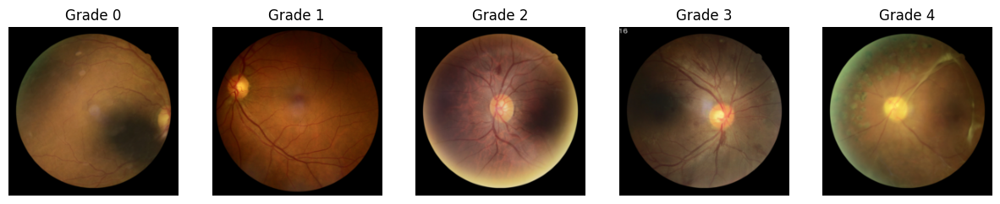

In [5]:
classes = np.unique(train_dataset.labels.flatten())

sample_images = []
for c in classes:
    labels_flat = train_dataset.labels.flatten()
    idx = np.where(labels_flat == c)[0][0]
    img_arr = np.squeeze(train_dataset.imgs[idx])
    sample_images.append(img_arr)

plt.figure(figsize=(15, 5))
for i, img_arr in enumerate(sample_images):
    plt.subplot(1, len(sample_images), i + 1)
    if img_arr.ndim == 3:
        plt.imshow(img_arr)
    else:
        plt.imshow(img_arr, cmap='gray')
    plt.title(f'Grade {int(classes[i])}')
    plt.axis('off')
plt.show()

From this plot we can confirm and try to visualize the anomalies described in the previous table. For example, we can locate in the Grade 2 image a blot haemorrhage in the upper-central part of the retina. Similar haemorrhages are present in Grade 3 image, in multiple instances across the whole retina. While, in the Grade 4 image, multiple gray dots in the retina, most probably neovascularizations, are widely present in the left part of the retina.

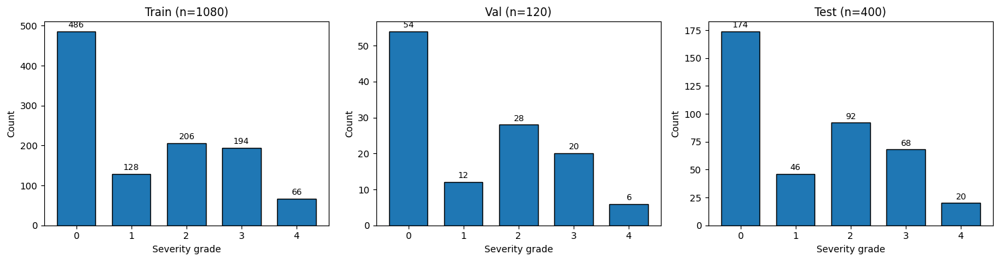

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, split_name, dataset in zip(axes,
                                    ['Train', 'Val', 'Test'],
                                    [train_dataset, val_dataset, test_dataset]):
    labels = dataset.labels.flatten()
    counts = np.bincount(labels, minlength=len(classes))
    ax.bar(classes, counts, edgecolor='black', width=0.7)
    ax.set_xticks(classes)
    ax.set_title(f'{split_name} (n={len(labels)})')
    ax.set_xlabel('Severity grade')
    ax.set_ylabel('Count')
    for cls, cnt in zip(classes, counts):
        ax.text(cls, cnt + max(counts) * 0.01, str(cnt),
                ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

From class distribution plots across the different splits, we can observe how the dataset is strongly skewed towards the healthy Grade 0 class. This will probably have important impacts on the accuracy of the further trained models. Indeed, in addition to very fine-grained changes between images of adjacent classes, this imbalance might be even more influential on the model's ability to correctly reflect these changes in the probability that will be assigned to each grade.

### Check for data leakage across splits

Because the dataset is well-maintained, the only offline data leakage check we do is the presence of duplicate images across different splits.

We compute the MD5 hash of each image and compare them across the training, validation, and test sets. Identical images will have the same hash, so finding any matching hashes inside and across splits, might indicate that the same image appears multiple times in the same split or in multiple splits, which could lead to data leakage and/or biased evaluation results.

In [7]:
def md5_hash(img_arr):
    data = img_arr.tobytes()
    return hashlib.md5(data).hexdigest()

train_hashes = [md5_hash(train_dataset.imgs[i]) for i in range(len(train_dataset))]
val_hashes = [md5_hash(val_dataset.imgs[i])   for i in range(len(val_dataset))]
test_hashes = [md5_hash(test_dataset.imgs[i])  for i in range(len(test_dataset))]

train_set = set(train_hashes)
val_set = set(val_hashes)
test_set = set(test_hashes)

print(f"\nSplit sizes:\n\tTrain={len(train_hashes)}\n\tVal={len(val_hashes)}\n\tTest={len(test_hashes)}")
print(f"Unique:\n\tTrain={len(train_set)}\n\tVal={len(val_set)}\n\tTest={len(test_set)}")
print(f"\nIntersections (potential leakage):")
print(f"\tTrain ∩ Val: {len(train_set & val_set)}")
print(f"\tTrain ∩ Test: {len(train_set & test_set)}")
print(f"\tVal ∩ Test: {len(val_set & test_set)}")

for name, h_list in [('Train', train_hashes), ('Val', val_hashes), ('Test', test_hashes)]:
    dup = len(h_list) - len(set(h_list))
    if dup > 0:
        print(f"{name} has {dup} duplicate image(s) within the split")


Split sizes:
	Train=1080
	Val=120
	Test=400
Unique:
	Train=1080
	Val=120
	Test=400

Intersections (potential leakage):
	Train ∩ Val: 0
	Train ∩ Test: 0
	Val ∩ Test: 0


## 4. Preprocessing techniques for diabetic retinopathy

To better facilitate model work in grading different images, we employ a common preprocessing technique used in many related works, **Ben Graham preprocessing**.
It consists of a simple Gaussian unsharp masking, that in this case allows to enhance lesion contrast, but still preserving retinal integrity.

### References:
- Graham, B. (2014). Spatially-sparse convolutional neural networks.
- Liu, R. et al. (2022). DeepDRiD: Diabetic Retinopathy Grading and Image Quality Estimation. (one of the model trained for grading use Ben Graham's preprocessing)
- Minarno, AE et al. (2024). Classification of Diabetic Retinopathy Disease Using Convolutional Neural Network (Ben Graham's preprocessing has been employed)
- Ramalakshmi, D. et al. (2025). An Interpretable Deep Learning Framework for Diabetic Retinopathy Grading Using Ben Graham Enhancement and Grad-CAM++

In [8]:
def preprocess_ben_graham(img: np.ndarray, img_size: int = 224, sigma: float = 5)  -> np.ndarray:
    """
    Ben Graham-style preprocessing: resize, apply Gaussian blur, and
    add a circular mask to focus on the central region of the image.

    Args:
        img (np.ndarray): Input image.
        img_size (int): Size to which the image is resized (default: 224)
        sigma (float): Standard deviation for Gaussian blur (default: 5)

    Returns:
        np.ndarray: Preprocessed image.
    """
    img = cv2.resize(img, (img_size, img_size))

    img = cv2.addWeighted(
        img, 4,
        cv2.GaussianBlur(img, (0, 0), sigma), -4,
        128
    )

    mask = np.zeros_like(img)
    h, w = img.shape[:2]
    cv2.circle(mask, (w // 2, h // 2), int(min(h, w) * 0.45), (1, 1, 1), -1)
    img = img * mask + 128 * (1 - mask)

    return np.clip(img, 0, 255).astype(np.uint8)

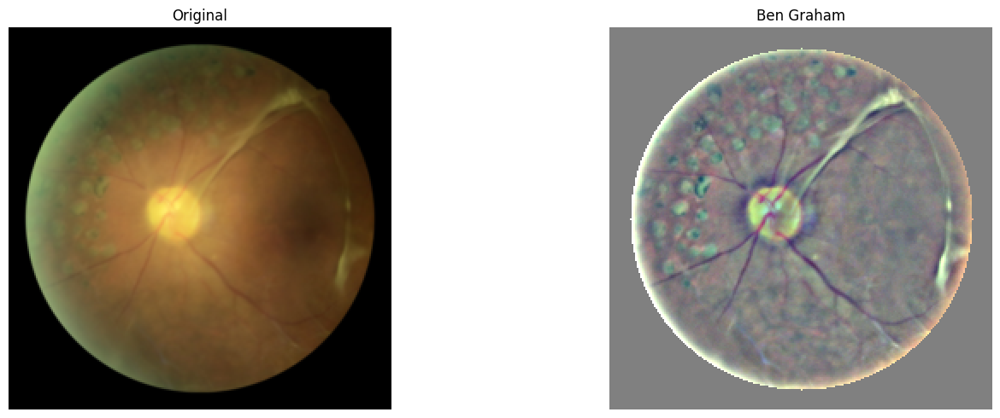

In [9]:
viz_class = 4

labels_flat = train_dataset.labels.flatten()
idx_sample = np.where(labels_flat == viz_class)[0][0]
sample = np.squeeze(train_dataset.imgs[idx_sample]).astype(np.uint8)

original = cv2.resize(sample, (224, 224))
bg = preprocess_ben_graham(sample, sigma=5)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
titles = ['Original', 'Ben Graham']
for ax, img, title in zip(axes, [original, bg], titles):
    ax.imshow(img)
    ax.set_title(title, fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()

Here, we can visualize, after selecting the class we want to show an example of, how Ben Graham's preprocessing enhances lesions in the retina fundus images.

### Preprocessing and save modified images

In [10]:
splits = [
    ("train", train_dataset),
    ("val",   val_dataset),
    ("test",  test_dataset),
]

for split_name, dataset in splits:
    labels_flat = dataset.labels.flatten()
    class_counts: dict[int, int] = {}
    for i in tqdm(range(len(dataset)), desc=split_name):
        label = int(labels_flat[i])
        class_dir = os.path.join(PREPROCESSED_DIR, split_name, str(label))
        os.makedirs(class_dir, exist_ok=True)

        img = np.squeeze(dataset.imgs[i]).astype(np.uint8)
        proc = preprocess_ben_graham(img)
        # proc = preprocess_usuyama(img)
        # proc = img

        class_counts[label] = class_counts.get(label, 0) + 1
        fname = f"{class_counts[label]:05d}.png"
        Image.fromarray(proc).save(os.path.join(class_dir, fname))

print(f"\nImages saved under {PREPROCESSED_DIR}/")

test: 100%|██████████| 400/400 [00:10<00:00, 38.62it/s]


Images saved under /content/preprocessed/


In [11]:
def load_preprocessed(split_name: str) -> tuple[np.ndarray, np.ndarray]:
    """
    Load saved preprocessed images and labels.
    
    Args:
        split_name (str): Name of the dataset split ('train', 'val', or 'test').
    Returns:
        Tuple[np.ndarray, np.ndarray]: A tuple containing:
            - imgs: A numpy array of shape (N, H, W, C) containing the preprocessed images.
            - labels: A numpy array of shape (N,) containing the corresponding labels for the images.
    """
    split_dir = os.path.join(PREPROCESSED_DIR, split_name)
    imgs, labels = [], []
    class_dirs = sorted(os.listdir(split_dir))
    for cls_dir in class_dirs:
        cls = int(cls_dir)
        img_folder = os.path.join(split_dir, cls_dir)
        for fname in sorted(os.listdir(img_folder), key=lambda x: int(x.split(".")[0])):
            fpath = os.path.join(img_folder, fname)
            img = cv2.imread(fpath)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            imgs.append(img)
            labels.append(cls)
    return np.stack(imgs), np.array(labels)

train_proc_imgs, train_proc_labels = load_preprocessed("train")
val_proc_imgs, val_proc_labels = load_preprocessed("val")
test_proc_imgs, test_proc_labels = load_preprocessed("test")

print(f"Train: {train_proc_imgs.shape} | labels={train_proc_labels.shape}")
print(f"Val: {val_proc_imgs.shape} | labels={val_proc_labels.shape}")
print(f"Test: {test_proc_imgs.shape} | labels={test_proc_labels.shape}")

Train: (1080, 224, 224, 3) | labels=(1080,)
Val: (120, 224, 224, 3) | labels=(120,)
Test: (400, 224, 224, 3) | labels=(400,)


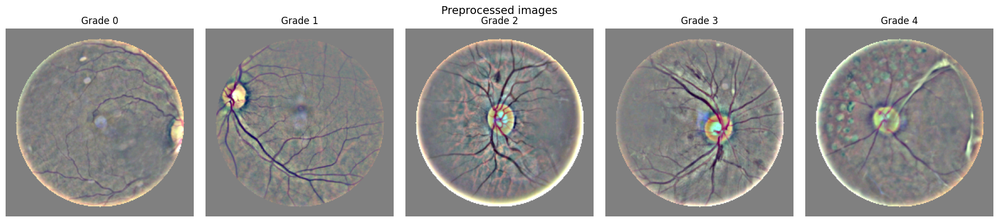

In [12]:
classes = np.unique(train_proc_labels.flatten())
fig, axes = plt.subplots(1, 5, figsize=(18, 4))

for idx, cls in enumerate(classes):
    labels_flat = train_proc_labels.flatten()
    sample_idx = np.where(labels_flat == cls)[0][0]
    sample = np.squeeze(train_proc_imgs[sample_idx]).astype(np.uint8)

    axes[idx].imshow(sample)
    axes[idx].set_title(f"Grade {int(cls)}", fontsize=12)
    axes[idx].axis("off")

fig.suptitle("Preprocessed images", fontsize=14)
plt.tight_layout()
plt.show()

Per-channel statistics (preprocessed training set):
 Channel     Mean      Std    Min    Max
       R   130.81    19.77      0    255
       G   129.74    19.15      0    255
       B   129.03    11.60      0    255

Mean: [0.31081352 0.31081352 0.31081352] std: [0.1828112  0.1761836  0.15619852]


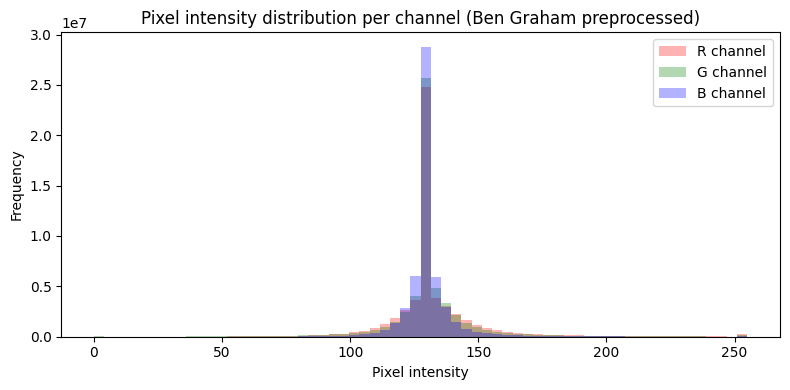

In [13]:
pixels = train_proc_imgs.reshape(-1, 3).astype(np.float32)

print("Per-channel statistics (preprocessed training set):")
print(f"{'Channel':>8} {'Mean':>8} {'Std':>8} {'Min':>6} {'Max':>6}")
for ch, name in enumerate(['R', 'G', 'B']):
    data = pixels[:, ch]
    print(f"{name:>8} {data.mean():>8.2f} {data.std():>8.2f} "
          f"{int(data.min()):>6} {int(data.max()):>6}")

MEAN = pixels.mean(axis=0) / 255.0
STD = pixels.std(axis=0) / 255.0

print(f"\nMean: {MEAN} std: {STD}")

fig, ax = plt.subplots(figsize=(8, 4))
colors = ['red', 'green', 'blue']
for ch, color in enumerate(colors):
    ax.hist(pixels[:, ch], bins=64, color=color, alpha=0.3,
            label=f'{["R","G","B"][ch]} channel')
ax.set_xlabel('Pixel intensity')
ax.set_ylabel('Frequency')
ax.set_title('Pixel intensity distribution per channel (Ben Graham preprocessed)')
ax.legend()
plt.tight_layout()
plt.show()

Computing mean and std on the training set, we can further use these exact values to normalize validation, test, and future inference data, projecting all inputs into a consistent feature space while strictly preventing data leakage.

In the cross-validation process, to avoid data leakage, these values will be computed on the actual training set generated at each fold.

## 5. Data augmentation

To avoid altering features that are clinically important for diagnosis, we apply only simple augmentations, such as random horizontal and vertical flips, and moderate affine transformations (including rotations, translations, and scaling). We avoid augmentations that could change the appearance of lesions or other key structures through drastic modifications to colors, brightness, or contrast. Instead, we apply only a slight color jitter to introduce more variation in the training set and mitigate overfitting, considering the small size of the dataset. Finally, we strictly avoid cropping or resizing operations that could remove important parts of the retina.

In [14]:
def make_train_transforms(mean: torch.Tensor, std: torch.Tensor) -> v2.Compose:
      return v2.Compose([
          v2.ToImage(),
          v2.RandomHorizontalFlip(p=0.5),
          v2.RandomVerticalFlip(p=0.5),
          v2.RandomAffine(degrees=90, translate=(0.1, 0.1)),
          v2.ColorJitter(brightness=0.2, contrast=0.2),
          v2.ToDtype(torch.float32, scale=True),
          v2.Normalize(mean, std),
      ])

def make_eval_transforms(mean: torch.Tensor, std: torch.Tensor) -> v2.Compose:
    return v2.Compose([
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean, std),
    ])

train_transforms = make_train_transforms(MEAN, STD)
eval_transforms = make_eval_transforms(MEAN, STD)

train_data = ImageFolder(root=os.path.join(PREPROCESSED_DIR, "train"), transform=train_transforms)
val_data = ImageFolder(root=os.path.join(PREPROCESSED_DIR, "val"),   transform=eval_transforms)
test_data = ImageFolder(root=os.path.join(PREPROCESSED_DIR, "test"),  transform=eval_transforms)
print(f"Train: {len(train_data)} samples, classes={train_data.classes}")
print(f"Val: {len(val_data)} samples, classes={val_data.classes}")
print(f"Test: {len(test_data)} samples, classes={test_data.classes}")


Train: 1080 samples, classes=['0', '1', '2', '3', '4']
Val: 120 samples, classes=['0', '1', '2', '3', '4']
Test: 400 samples, classes=['0', '1', '2', '3', '4']


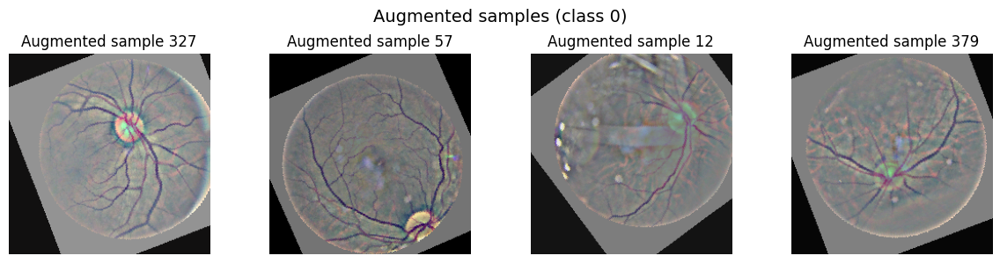

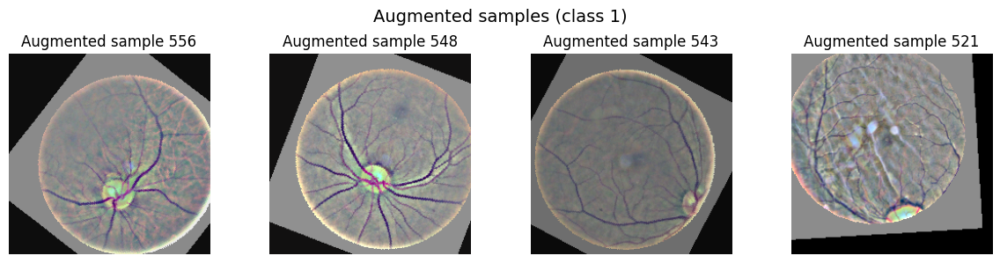

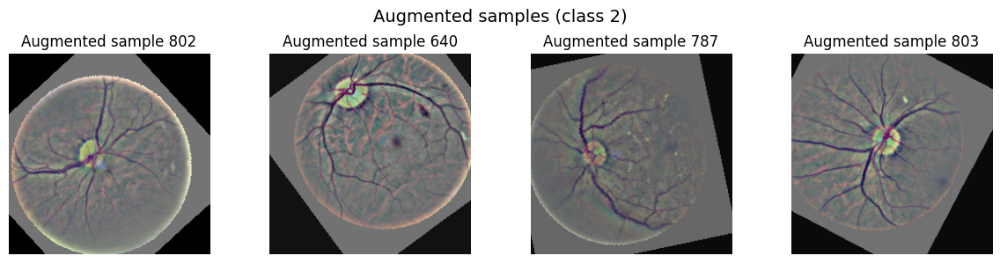

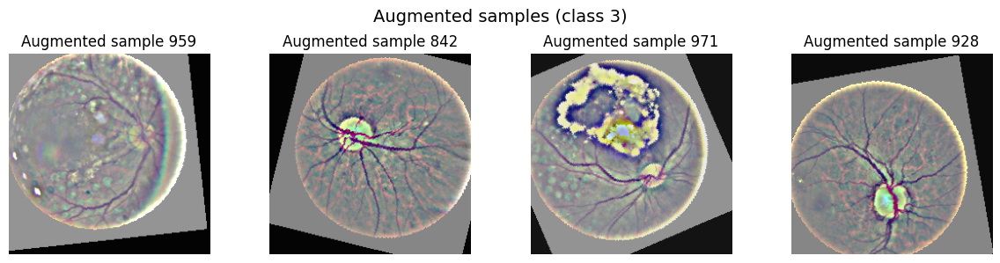

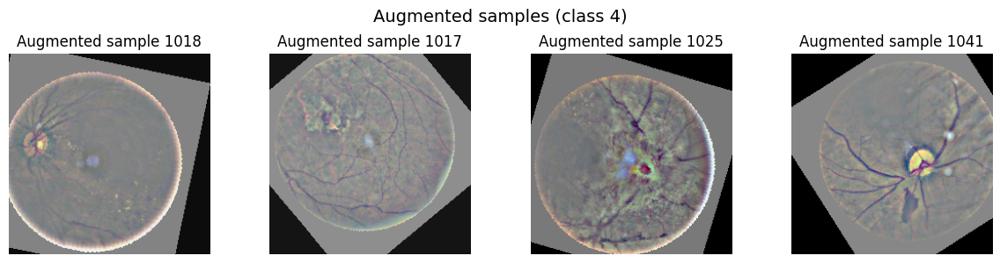

In [15]:
def plot_augmented_samples(dataset, class_idx, num_samples=4) -> None:
    """
    Plot augmented samples from the dataset for a specific class.

    Args:
        dataset (ImageFolder): The dataset containing the images.
        class_idx (int): The index of the class to visualize.
        num_samples (int): Number of augmented samples to display.
    """
    class_indices = [i for i, (_, label) in enumerate(dataset.samples) if label == class_idx]

    selected_indices = random.sample(class_indices, num_samples)

    plt.figure(figsize=(12, 3))

    for i, idx in enumerate(selected_indices):
        path, _ = dataset.samples[idx]
        img = Image.open(path).convert('RGB')
        img = make_train_transforms(MEAN, STD)(img)
        img = img.permute(1, 2, 0).numpy()
        img = (img * STD + MEAN) * 255.0
        img = np.clip(img, 0, 255).astype(np.uint8)

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.title(f'Augmented sample {selected_indices[i]}')
        plt.axis('off')

    plt.suptitle(f'Augmented samples (class {class_idx})', fontsize=14)
    plt.tight_layout()
    plt.show()

plot_augmented_samples(train_data, class_idx=0, num_samples=4)
plot_augmented_samples(train_data, class_idx=1, num_samples=4)
plot_augmented_samples(train_data, class_idx=2, num_samples=4)
plot_augmented_samples(train_data, class_idx=3, num_samples=4)
plot_augmented_samples(train_data, class_idx=4, num_samples=4)


## 6. Model architecture

Ablation Study Techniques
- `frozen_backbone` (Frozen Backbone / Head Only): The model backbone (MobileNetV4) is frozen (requires_grad = False). Only the final classifier (classifier/head) is trained. This technique evaluates how well the features extracted by the pre-trained model perform on your specific domain.

- `partial_ft` (Partial Fine-Tuning / Backbone Tail Tuning): Most of the backbone weights are frozen, except for the last two layers (or the final convolutional block). This technique is used to refine high-level features to better adapt to the specificities of retinal images without risking catastrophic forgetting of the information learned on ImageNet.

- `full_ft` (Full Fine-Tuning / Full Training): All model parameters (backbone + classifier) are unfrozen (requires_grad = True). If the model is initialized with pre-trained weights, it is referred to as full fine-tuning; if the weights are initialized randomly (using pretrained=False), it is referred to as training from scratch.

In [16]:
def get_model(num_classes=5, strategy='frozen_backbone', use_coral=False):
    """
    Create a MobileNetV4 model with the specified number of classes and training strategy.
    """
    pretrained = (strategy != 'full_ft')
    
    # Se usiamo CORAL, l'output layer deve avere (num_classes - 1) unità logit binarie
    effective_classes = (num_classes - 1) if use_coral else num_classes
    
    model = timm.create_model('efficientnetv2_rw_t', pretrained=pretrained, num_classes=effective_classes)
    
    # Salviamo l'attributo num_classes sul modello, necessario per le funzioni train_epoch_coral e validate_coral
    model.num_classes = num_classes
    
    if use_coral:
        in_features = model.classifier.in_features
        model.classifier = CoralLayer(size_in=in_features, num_classes=num_classes)
        
    return model.to(DEVICE)



def set_trainable_layers(model, strategy):
    # 1. Blocca tutto inizialmente
    for param in model.parameters():
        param.requires_grad = False
    
    # 2. Sblocca sempre il classificatore
    # In EfficientNet-V2, il classificatore è 'classifier' (un Sequential)
    for param in model.classifier.parameters():
        param.requires_grad = True
        
    # 3. Gestione logica Ablation
    if strategy == 'partial_ft':
        # In EfficientNet, i blocchi convoluzionali sono in model.blocks
        # Sblocchiamo gli ultimi 2 blocchi per un fine-tuning più fine
        for block in model.blocks[-2:]:
            for param in block.parameters():
                param.requires_grad = True
            
    elif strategy == 'full_ft':
        # Sblocca tutto
        for param in model.parameters():
            param.requires_grad = True
                 

In [18]:
model = get_model(num_classes=len(classes), use_coral=False).to(DEVICE)
summary(model, input_size=(1, 3, 224, 224), device=DEVICE)

Layer (type:depth-idx)                        Output Shape              Param #
EfficientNet                                  [1, 5]                    --
├─Conv2d: 1-1                                 [1, 24, 112, 112]         648
├─BatchNormAct2d: 1-2                         [1, 24, 112, 112]         48
│    └─Identity: 2-1                          [1, 24, 112, 112]         --
│    └─SiLU: 2-2                              [1, 24, 112, 112]         --
├─Sequential: 1-3                             [1, 208, 7, 7]            --
│    └─Sequential: 2-3                        [1, 24, 112, 112]         --
│    │    └─ConvBnAct: 3-1                    [1, 24, 112, 112]         5,232
│    │    └─ConvBnAct: 3-2                    [1, 24, 112, 112]         5,232
│    └─Sequential: 2-4                        [1, 40, 56, 56]           --
│    │    └─EdgeResidual: 3-3                 [1, 40, 56, 56]           24,848
│    │    └─EdgeResidual: 3-4                 [1, 40, 56, 56]           64,400
│    

In [19]:
model_coral = get_model(num_classes=len(classes), use_coral=True).to(DEVICE)
summary(model_coral, input_size=(1, 3, 224, 224), device=DEVICE)

Layer (type:depth-idx)                        Output Shape              Param #
EfficientNet                                  [1, 4]                    --
├─Conv2d: 1-1                                 [1, 24, 112, 112]         648
├─BatchNormAct2d: 1-2                         [1, 24, 112, 112]         48
│    └─Identity: 2-1                          [1, 24, 112, 112]         --
│    └─SiLU: 2-2                              [1, 24, 112, 112]         --
├─Sequential: 1-3                             [1, 208, 7, 7]            --
│    └─Sequential: 2-3                        [1, 24, 112, 112]         --
│    │    └─ConvBnAct: 3-1                    [1, 24, 112, 112]         5,232
│    │    └─ConvBnAct: 3-2                    [1, 24, 112, 112]         5,232
│    └─Sequential: 2-4                        [1, 40, 56, 56]           --
│    │    └─EdgeResidual: 3-3                 [1, 40, 56, 56]           24,848
│    │    └─EdgeResidual: 3-4                 [1, 40, 56, 56]           64,400
│    

In [20]:
def worker_init_fn(worker_id: int) -> None:
    """
    Seed each DataLoader worker deterministically based on its ID.

    Args:
        worker_id (int): The ID of the DataLoader worker.
    """
    np.random.seed(SEED + worker_id)
    random.seed(SEED + worker_id)
    torch.manual_seed(SEED + worker_id)


class FolderDataset(Dataset):
    """
    PyTorch Dataset for loading images from a folder structure where each class has its own subdirectory.
    """

    def __init__(self, paths, targets, transform):
        self.paths = paths
        self.targets = targets
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        target = self.targets[idx]
        if self.transform:
            img = self.transform(img)
        return img, target


def train_epoch_ce(model: torch.nn.Module, loader: DataLoader, criterion: torch.nn.Module, optimizer: torch.optim.Optimizer) -> float:
    """
    Train one epoch with Cross-Entropy loss.

    Args:
        model (torch.nn.Module): The model to train.
        loader (DataLoader): DataLoader for the training data.
        criterion (torch.nn.Module): Loss function (CrossEntropyLoss).
        optimizer (torch.optim.Optimizer): Optimizer for updating model parameters.
    Returns:
        float: Average loss over the epoch.
    """
    model.train()
    total_loss = 0.0
    for x, y in loader:
        x = x.to(DEVICE)
        y = y.squeeze().long().to(DEVICE) # <-- FIXED

        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        # Exact loss accumulation
        total_loss += loss.item() * x.size(0)

    return total_loss / len(loader.dataset)


def validate_ce(model: torch.nn.Module, loader: DataLoader) -> tuple[np.ndarray, np.ndarray, np.ndarray, float]:
    """
    Evaluate CE model.

    Args:
        model (torch.nn.Module): The model to evaluate.
        loader (DataLoader): DataLoader for the validation data.
    Returns:
        tuple[np.ndarray, np.ndarray, np.ndarray, float]: Predicted labels, true labels, predicted probabilities, and average loss.
    """
    model.eval()
    total_loss = 0.0
    preds, labels, probs = [], [], []

    with torch.no_grad():
        for x, y in loader:
            x = x.to(DEVICE)
            y = y.squeeze().long().to(DEVICE)

            logits = model(x)

            batch_loss = F.cross_entropy(logits, y, reduction='sum').item()
            total_loss += batch_loss

            prob = torch.softmax(logits, dim=1)

            preds.extend(logits.argmax(dim=1).cpu().numpy())
            labels.extend(y.cpu().numpy())
            probs.append(prob.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)

    return (
        np.array(preds),
        np.array(labels),
        np.concatenate(probs, axis=0),
        avg_loss
    )


def train_epoch_coral(model: torch.nn.Module, loader: DataLoader, optimizer: torch.optim.Optimizer, importance_weights: torch.Tensor) -> float:
    """
    Train one epoch with CORAL loss.

    Args:
        model (torch.nn.Module): The model to train.
        loader (DataLoader): DataLoader for the training data.
        optimizer (torch.optim.Optimizer): Optimizer for updating model parameters.
        importance_weights (torch.Tensor): Importance weights for CORAL loss.

    Returns:
        float: Average loss over the epoch.
    """
    model.train()
    total_loss = 0.0
    for x, y in loader:
        x = x.to(DEVICE)
        y = y.squeeze().long().to(DEVICE)

        levels = levels_from_labelbatch(y, num_classes=model.num_classes).to(DEVICE)

        optimizer.zero_grad()
        logits = model(x)
        loss = coral_loss(logits, levels, importance_weights=importance_weights)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * x.size(0)

    return total_loss / len(loader.dataset)


def validate_coral(model: torch.nn.Module, loader: DataLoader, importance_weights: torch.Tensor) -> tuple[np.ndarray, np.ndarray, np.ndarray, float]:
    """
    Evaluate CORAL model on MedMNIST. Returns (preds, labels, probs, avg_loss).
    """
    model.eval()
    total_loss = 0.0
    preds, labels, probs = [], [], []

    with torch.no_grad():
        for x, y in loader:
            x = x.to(DEVICE)
            y = y.squeeze().long().to(DEVICE)

            logits = model(x)
            levels = levels_from_labelbatch(y, num_classes=model.num_classes).to(DEVICE)

            batch_loss = coral_loss(logits, levels, importance_weights=importance_weights, reduction='sum').item()
            total_loss += batch_loss

            probas = torch.sigmoid(logits)

            preds.extend(proba_to_label(probas).cpu().numpy())
            labels.extend(y.cpu().numpy())

            p_cls_0 = 1.0 - probas[:, :1]
            p_cls_mid = probas[:, :-1] - probas[:, 1:]
            p_cls_last = probas[:, -1:]

            class_probs = torch.cat([p_cls_0, p_cls_mid, p_cls_last], dim=1)
            probs.append(class_probs.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)

    return (
        np.array(preds),
        np.array(labels),
        np.concatenate(probs, axis=0),
        avg_loss
    )


def report_metrics(labels: np.ndarray, preds: np.ndarray, probs: np.ndarray, split_name: str = "val", title: str = "Report metrics") -> np.ndarray:
    """
    Report metrics for a given split.

    Args:
        labels: True labels (numpy array).
        preds: Predicted labels (numpy array).
        probs: Predicted probabilities (numpy array).
        split_name: Name of the dataset split (default: "val").
        title: Title for the confusion matrix plot (default: "Report metrics").
    Returns:
        cm_norm: Normalized confusion matrix (numpy array).
    """
    print(f"\n{split_name} set results:")
    print(f"\tMacro F1: {f1_score(labels, preds, average='macro'):.4f}")
    print(f"\tQWK: {cohen_kappa_score(labels, preds, weights='quadratic'):.4f}")
    print(f"\tAccuracy: {accuracy_score(labels, preds):.4f}")
    print(f"\tAUC: {roc_auc_score(labels, probs, multi_class='ovr', average='macro'):.4f}")

    report = classification_report(
        labels,
        preds,
        target_names=[f"Grade {i}" for i in range(5)],
        output_dict=True,
        zero_division=0
    )

    print("\nPer-class metrics:")
    for cls in range(5):
        cls_key = f"Grade {cls}"
        prec = report[cls_key]['precision']
        rec = report[cls_key]['recall']
        f1_c = report[cls_key]['f1-score']
        print(f"\tGrade {cls}: precision={prec:.3f}\trecall={rec:.3f}\tF1={f1_c:.3f}")

    cm_norm = confusion_matrix(labels, preds, normalize='true')

    fig, ax = plt.subplots(figsize=(6, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=[f'Grade {i}' for i in range(5)])
    disp.plot(cmap=plt.cm.Blues, values_format='.2f', ax=ax)

    plt.title(title)
    plt.show()

    return cm_norm


def plot_roc(labels: np.ndarray, probs: np.ndarray, title: str = "ROC curves") -> None:
    """
    Plot ROC curves for each class and display AUC.

    Args:
        labels: True labels (numpy array).
        probs: Predicted probabilities (numpy array).
        title: Title for the ROC plot (default: "ROC curves").
    """
    fig, ax = plt.subplots(figsize=(7, 5))
    for i in range(5):
        fpr, tpr, _ = roc_curve((labels == i).astype(int), probs[:, i])
        a = sklearn.metrics.auc(fpr, tpr)
        ax.plot(fpr, tpr, label=f'Grade {i} (AUC = {a:.3f})')

    ax.plot([0, 1], [0, 1], 'k--', alpha=0.5)
    ax.set_xlabel('False positive rate')
    ax.set_ylabel('True positive rate')
    ax.legend()

    plt.title(title)
    plt.tight_layout(rect=[0, 0.03, 1, 1])
    plt.show()


def train_ce(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    epochs: int = 50,
    class_weights_data: Optional[torch.Tensor] = None,
    early_stopping: Optional[int] = 10,
    plot: bool = False,
):
    """
    Full CE training loop with early stopping.

    Args:
        model: nn.Module (already on DEVICE).
        train_loader: DataLoader for training.
        val_loader: DataLoader for validation (early stopping).
        test_loader: optional DataLoader for test evaluation.
        epochs: max epochs.
        class_weights_data: tensor of shape (5,) or None (unweighted).
        early_stopping: stop if no improvement in AUC for this many epochs.
        plot: if True, show loss/acc/AUC curves + ROC on test.

    Returns:
        Tuple (model, metrics, history).
    """
    criterion = (
        nn.CrossEntropyLoss(weight=class_weights_data) if class_weights_data is not None else nn.CrossEntropyLoss()
    )

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, 
    T_max=EPOCHS, 
    eta_min=1e-6)


    train_losses, val_losses, accs, aucs = [], [], [], []
    best_auc, best_state, stale = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        tr_loss = train_epoch_ce(model, train_loader, criterion, optimizer)
        preds, labels, probs, vl_loss = validate_ce(model, val_loader)

        acc = accuracy_score(labels, preds)
        qwk = cohen_kappa_score(labels, preds, weights="quadratic")
        auc = roc_auc_score(labels, probs, multi_class="ovr", average="macro")

        train_losses.append(tr_loss)
        val_losses.append(vl_loss)
        accs.append(acc)
        aucs.append(auc)

        if auc > best_auc:
            best_auc = auc
            best_state = copy.deepcopy(model.state_dict())
            stale = 0
        else:
            stale += 1

        scheduler.step()

        if epoch == 1 or epoch % 5 == 0:
            lr = optimizer.param_groups[0]["lr"]
            print(
                f"\tEpoch {epoch:2d}/{epochs} | LR: {lr:.2e} | Train loss: {tr_loss:.4f} | Val loss: {vl_loss:.4f} | Acc: {acc:.4f} | QWK: {qwk:.4f} | AUC: {auc:.4f}"
            )
        if early_stopping is not None and stale >= early_stopping:
            print(f"\tEarly stopping at epoch {epoch}")
            break

    model.load_state_dict(best_state)
    model.eval()

    if plot:
        _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        ax1.plot(train_losses, label="Train loss")
        ax1.plot(val_losses, label="Val loss")
        ax1.set_xlabel("Epoch")
        ax1.set_ylabel("Loss")
        ax1.legend()
        ax2.plot(accs, label="Accuracy")
        ax2.plot(aucs, label="AUC")
        ax2.set_xlabel("Epoch")
        ax2.legend()
        plt.suptitle(f"Training curves - CE")
        plt.tight_layout()
        plt.show()

    val_preds, val_labels, val_probs, _ = validate_ce(model, val_loader)
    report_metrics(val_labels, val_preds, val_probs, "val", f"Confusion matrix (val) - CE")

    return (
        model,
        dict(val_preds=val_preds, val_labels=val_labels, val_probs=val_probs),
        dict(train_losses=train_losses, val_losses=val_losses, accs=accs, aucs=aucs),
    )


def compute_coral_importance(labels: np.ndarray) -> torch.Tensor:
    """
    CORAL importance weights (Cao et al. 2019 Eq.7) from a label array.

    Args:
        labels: numpy array of shape (N,) with integer labels in [0, 4].
    Returns:
        torch.Tensor of shape (4,) with normalized importance weights for CORAL loss.
    """
    N = len(labels)
    counts = np.bincount(labels, minlength=5)
    cum_pos = np.cumsum(counts[::-1])[::-1][1:]  # S_k for k=0..3
    M = np.maximum(cum_pos, N - cum_pos)
    sqrt_M = np.sqrt(M)
    return torch.tensor(sqrt_M / sqrt_M.max(), dtype=torch.float32, device=DEVICE)


def train_coral(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    epochs: int = 50,
    importance_weights: Optional[torch.Tensor] = None,
    early_stopping: Optional[int] = 10,
    plot: bool = False,
):
    """
    Full CORAL training loop with early stopping.

    Args:
        model: nn.Module (already on DEVICE).
        train_loader: DataLoader for training.
        val_loader: DataLoader for validation (early stopping).
        epochs: max epochs.
        importance_weights: tensor of shape (4,) or None (unweighted).
        early_stopping: number of epochs to wait for improvement before stopping.
        plot: if True, show loss/acc/AUC curves + ROC on test.
    Returns:
        Tuple (model, metrics, history).
    """
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)

    train_losses, val_losses, accs, aucs = [], [], [], []
    best_auc, best_state, stale = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        tr_loss = train_epoch_coral(model, train_loader, optimizer, importance_weights)
        preds, labels, probs, vl_loss = validate_coral(model, val_loader, importance_weights)

        acc = accuracy_score(labels, preds)
        qwk = cohen_kappa_score(labels, preds, weights="quadratic")
        auc = roc_auc_score(labels, probs, multi_class="ovr", average="macro")

        train_losses.append(tr_loss)
        val_losses.append(vl_loss)
        accs.append(acc)
        aucs.append(auc)

        if auc > best_auc:
            best_auc = auc
            best_state = copy.deepcopy(model.state_dict())
            stale = 0
        else:
            stale += 1

        scheduler.step()

        if epoch == 1 or epoch % 5 == 0:
            lr = optimizer.param_groups[0]["lr"]
            print(
                f"\tEpoch {epoch:2d}/{epochs} | LR: {lr:.2e} | Train loss: {tr_loss:.4f} | Val loss: {vl_loss:.4f} | Acc: {acc:.4f} | QWK: {qwk:.4f} | AUC: {auc:.4f}"
            )
        if early_stopping is not None and stale >= early_stopping:
            print(f"\tEarly stopping at epoch {epoch}")
            break

    model.load_state_dict(best_state)
    model.eval()

    if plot:
        _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        ax1.plot(train_losses, label="Train loss")
        ax1.plot(val_losses, label="Val loss")
        ax1.set_xlabel("Epoch")
        ax1.set_ylabel("Loss")
        ax1.legend()
        ax2.plot(accs, label="Accuracy")
        ax2.plot(aucs, label="AUC")
        ax2.set_xlabel("Epoch")
        ax2.legend()
        plt.suptitle(f"Training curves - CORAL")
        plt.tight_layout()
        plt.show()

    val_preds, val_labels, val_probs, _ = validate_coral(model, val_loader, importance_weights)
    report_metrics(val_labels, val_preds, val_probs, "val", f"Confusion matrix (val) - CORAL")

    return (
        model,
        dict(val_preds=val_preds, val_labels=val_labels, val_probs=val_probs),
        dict(train_losses=train_losses, val_losses=val_losses, accs=accs, aucs=aucs),
    )


all_paths = [p for p, _ in train_data.imgs]
all_targets = np.array(train_data.targets)

N_FOLDS, EPOCHS, BATCH_SIZE = 5, 50, 32

### Optimization

All models are optimized with AdamW (lr=$10^{-3}$, weight decay=$10^{-3}$) and a Cosine Annealing scheduler decaying to $10^{-6}$ over a maximum of 50 epochs, which is sufficient as an upper bound since early stopping (patience=10 on validation AUC) typically terminates training well before reaching it. A batch size of 32 is used throughout, balancing gradient stability and memory for $224 \times 224$ RGB inputs.

### Loss functions

Regarding loss functions, this project explores two distinct approaches for training the model:
- **Cross-Entropy (CE) loss**, which treats the problem as a standard multi-class classification task, and
- **CORAL loss**, which is specifically designed for ordinal regression tasks, taking into account the ordered nature of the DR grades. The CORAL loss penalizes predictions that are further away from the true class more heavily than those that are closer, thus encouraging the model to respect the ordinal relationships between classes

By exploiting the same architecture, we can directly compare the performance of these two loss functions in the context of DR grading. Because of the different loss functions, only the final classification head is different (different number of output nodes), while the convolutional backbone remains the same, with SE, features fusion and bottleneck compression modules employed.

### Metrics

During the training and evaluation phases, we employ a partial common set of metrics to assess the model's performance. These include:
- **Accuracy**: Measures the overall correctness of the model's predictions across all classes.
- **Area Under the Curve (AUC)**: Evaluates the model's ability to distinguish between classes, particularly useful in imbalanced datasets.
- **Quadratic Weighted Kappa (QWK)**: Specifically designed for ordinal classification tasks, QWK assesses the agreement between predicted and true labels while considering the severity of misclassifications. It penalizes predictions that are further away from the true class more heavily than those that are closer, making it particularly suitable for evaluating DR grading models.

For the evaluation phase, we also compute the classification report, which provides a detailed breakdown of precision, recall, and F1-score for each class. This allows for a more granular understanding of the model's performance across different DR grades, highlighting areas where the model excels or may require further improvement.

Finally, the normalized confusion matrix is also computed, which provides a visual representation of the model's performance across all classes, allowing for easy identification of patterns in misclassifications and areas where the model may need improvement.

## 7. Frozen backbone: cross-entropy model CV and final training


Fold 1/5
	Class weights:	 {0: np.float32(0.445), 1: np.float32(1.678), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.7946 | Val loss: 2.6623 | Acc: 0.1759 | QWK: 0.0377 | AUC: 0.5056
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 2.0511 | Val loss: 2.4207 | Acc: 0.2454 | QWK: 0.2836 | AUC: 0.5764
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.8227 | Val loss: 2.1105 | Acc: 0.3194 | QWK: 0.3996 | AUC: 0.6247
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.6563 | Val loss: 2.0130 | Acc: 0.3333 | QWK: 0.4478 | AUC: 0.6487
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.5115 | Val loss: 1.8856 | Acc: 0.3611 | QWK: 0.4823 | AUC: 0.6688
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.4218 | Val loss: 1.9091 | Acc: 0.3519 | QWK: 0.4655 | AUC: 0.6690
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.4211 | Val loss: 1.8547 | Acc: 0.3611 | QWK: 0.5202 | AUC: 0.6814
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.4205 | Val loss: 1.8756 | Acc: 0.3611 | QWK: 0.49

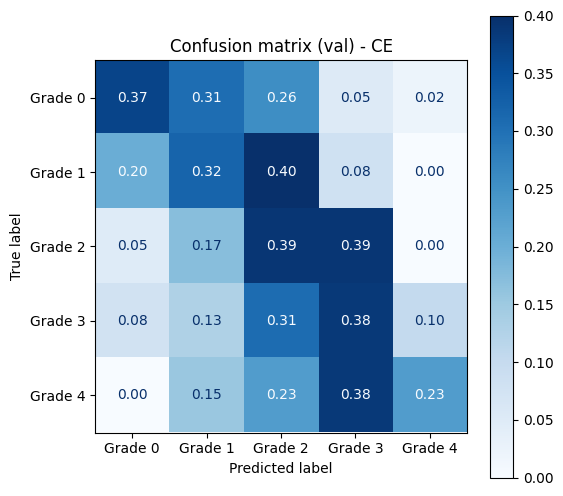


Fold 2/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.4571 | Val loss: 2.4224 | Acc: 0.2269 | QWK: 0.1017 | AUC: 0.5053
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.9820 | Val loss: 2.1585 | Acc: 0.2546 | QWK: 0.2135 | AUC: 0.5622
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.7447 | Val loss: 1.9566 | Acc: 0.2917 | QWK: 0.3238 | AUC: 0.6034
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.6457 | Val loss: 1.7860 | Acc: 0.3704 | QWK: 0.3966 | AUC: 0.6368
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.5629 | Val loss: 1.6991 | Acc: 0.3889 | QWK: 0.4113 | AUC: 0.6574
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.5344 | Val loss: 1.6508 | Acc: 0.4120 | QWK: 0.4412 | AUC: 0.6744
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.4322 | Val loss: 1.6101 | Acc: 0.4213 | QWK: 0.4453 | AUC: 0.6801
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3632 | Val loss: 1.5758 | Acc: 0.4120 | QWK: 0.43

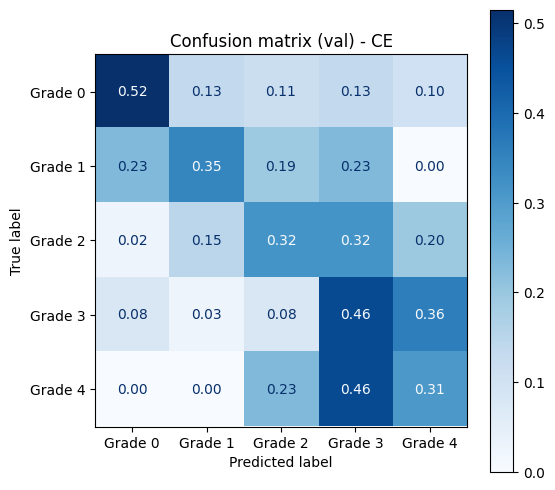


Fold 3/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.7160 | Val loss: 2.5634 | Acc: 0.2083 | QWK: 0.1042 | AUC: 0.4937
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 2.0744 | Val loss: 2.1801 | Acc: 0.2130 | QWK: 0.2535 | AUC: 0.5582
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.7448 | Val loss: 1.8790 | Acc: 0.3056 | QWK: 0.3891 | AUC: 0.6213
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.6272 | Val loss: 1.7333 | Acc: 0.3565 | QWK: 0.4365 | AUC: 0.6660
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.6065 | Val loss: 1.6268 | Acc: 0.4120 | QWK: 0.4606 | AUC: 0.6890
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.4744 | Val loss: 1.5213 | Acc: 0.4259 | QWK: 0.5355 | AUC: 0.7065
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3937 | Val loss: 1.5310 | Acc: 0.4213 | QWK: 0.5270 | AUC: 0.7131
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.4556 | Val loss: 1.5144 | Acc: 0.4306 | QWK: 0.56

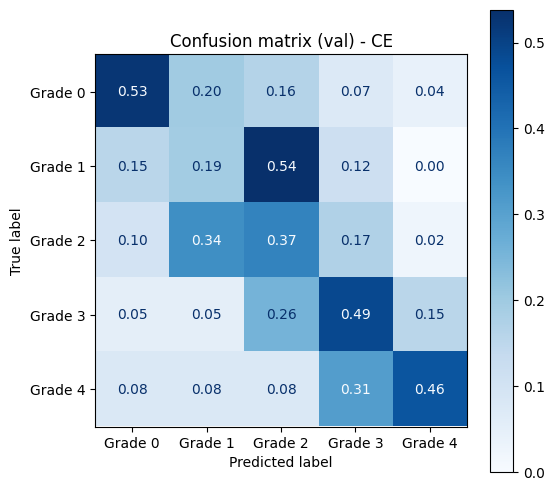


Fold 4/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.5949 | Val loss: 2.8705 | Acc: 0.1806 | QWK: -0.0079 | AUC: 0.4926
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 2.0931 | Val loss: 2.2399 | Acc: 0.2546 | QWK: 0.1802 | AUC: 0.5585
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.8291 | Val loss: 1.9121 | Acc: 0.3194 | QWK: 0.3390 | AUC: 0.6184
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.6014 | Val loss: 1.7696 | Acc: 0.3657 | QWK: 0.3714 | AUC: 0.6476
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.5511 | Val loss: 1.7851 | Acc: 0.3565 | QWK: 0.3977 | AUC: 0.6609
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.5457 | Val loss: 1.6701 | Acc: 0.3750 | QWK: 0.4307 | AUC: 0.6737
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.4569 | Val loss: 1.6946 | Acc: 0.3426 | QWK: 0.3922 | AUC: 0.6848
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.4380 | Val loss: 1.6437 | Acc: 0.3704 | QWK: 0.4

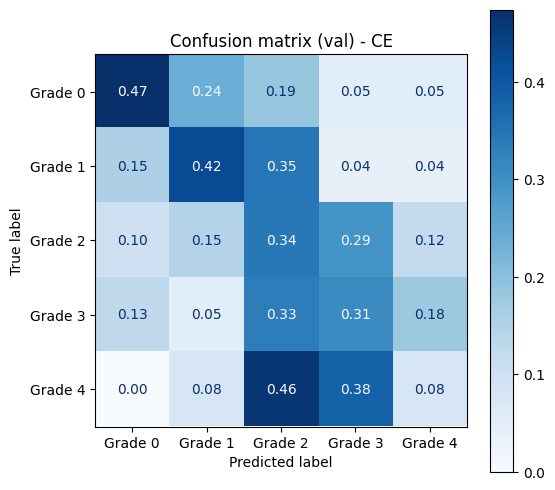


Fold 5/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.678), 2: np.float32(1.054), 3: np.float32(1.108), 4: np.float32(3.323)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.7849 | Val loss: 2.1045 | Acc: 0.2824 | QWK: 0.2065 | AUC: 0.5792
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 2.0879 | Val loss: 1.8308 | Acc: 0.3333 | QWK: 0.2373 | AUC: 0.6497
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.7808 | Val loss: 1.5381 | Acc: 0.4028 | QWK: 0.3389 | AUC: 0.7076
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.7174 | Val loss: 1.5072 | Acc: 0.4074 | QWK: 0.3775 | AUC: 0.7221
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.5479 | Val loss: 1.4446 | Acc: 0.4213 | QWK: 0.4182 | AUC: 0.7410
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.5227 | Val loss: 1.3848 | Acc: 0.4630 | QWK: 0.4790 | AUC: 0.7487
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.4854 | Val loss: 1.3712 | Acc: 0.4630 | QWK: 0.4825 | AUC: 0.7601
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.4241 | Val loss: 1.3583 | Acc: 0.4676 | QWK: 0.4

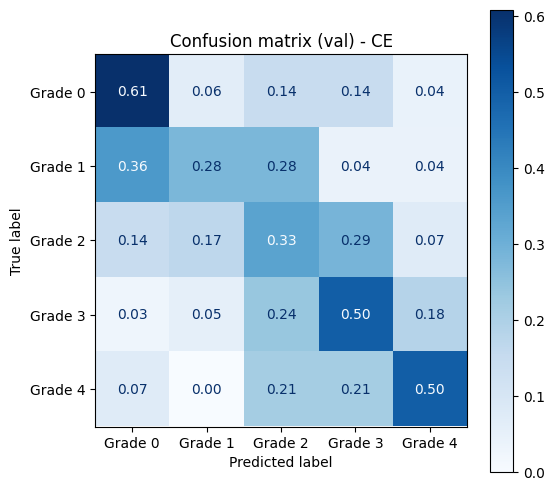


Results (CE, 5-fold CV):
	Accuracy: 0.4241 +/- 0.0451
	QWK: 0.5013 +/- 0.0290
	AUC: 0.7142 +/- 0.0298


In [ ]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'frozen_backbone' 
use_coral = False         
num_classes = len(classes)


skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
fold_results_ce = []


for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(all_targets)), all_targets), 1):
    print(f"\nFold {fold}/{N_FOLDS}")
    
    classes = np.unique(all_targets[train_idx])
    class_weights = compute_class_weight('balanced', classes=classes, y=all_targets[train_idx])
    w = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)
    print(f"\tClass weights:\t", dict(zip(classes.tolist(), np.round(w.cpu().numpy(), 3))))

    train_fold = FolderDataset([all_paths[i] for i in train_idx], all_targets[train_idx], train_transforms)
    train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    val_fold   = FolderDataset([all_paths[i] for i in val_idx],   all_targets[val_idx],   eval_transforms)
    val_loader   = DataLoader(val_fold,   BATCH_SIZE, shuffle=False,
                              worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    model = get_model(num_classes=num_classes, strategy=strategy, use_coral=use_coral)
    set_trainable_layers(model, strategy)
    fold_model, fold_metrics, _ = train_ce(model, train_loader, val_loader,
            epochs=EPOCHS, class_weights_data=w)
    acc = accuracy_score(fold_metrics['val_labels'], fold_metrics['val_preds'])
    qwk = cohen_kappa_score(fold_metrics['val_labels'], fold_metrics['val_preds'], weights='quadratic')
    auc = roc_auc_score(fold_metrics['val_labels'], fold_metrics['val_probs'], multi_class='ovr', average='macro')
    fold_results_ce.append({'acc': acc, 'qwk': qwk, 'auc': auc})

accs_ce = [r['acc'] for r in fold_results_ce]
qwks_ce = [r['qwk'] for r in fold_results_ce]
aucs_ce = [r['auc'] for r in fold_results_ce]

print(f"\nResults (CE, {N_FOLDS}-fold CV):")
print(f"\tAccuracy: {np.mean(accs_ce):.4f} +/- {np.std(accs_ce):.4f}")
print(f"\tQWK: {np.mean(qwks_ce):.4f} +/- {np.std(qwks_ce):.4f}")
print(f"\tAUC: {np.mean(aucs_ce):.4f} +/- {np.std(aucs_ce):.4f}")

### Training on the full training set

	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.688), 2: np.float32(1.049), 3: np.float32(1.113), 4: np.float32(3.273)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.6479 | Val loss: 2.2479 | Acc: 0.2333 | QWK: 0.0337 | AUC: 0.5724
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 2.0032 | Val loss: 2.1181 | Acc: 0.2417 | QWK: 0.2500 | AUC: 0.6374
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.8072 | Val loss: 1.9185 | Acc: 0.3083 | QWK: 0.4180 | AUC: 0.6714
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.5728 | Val loss: 1.7116 | Acc: 0.3500 | QWK: 0.4037 | AUC: 0.6817
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.4632 | Val loss: 1.6921 | Acc: 0.3667 | QWK: 0.4935 | AUC: 0.6907
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.4184 | Val loss: 1.6428 | Acc: 0.3667 | QWK: 0.4962 | AUC: 0.6979
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3534 | Val loss: 1.6312 | Acc: 0.3833 | QWK: 0.4900 | AUC: 0.6936
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.4335 | Val loss: 1.6388 | Acc: 0.3833 | QWK: 0.4821 | AUC:

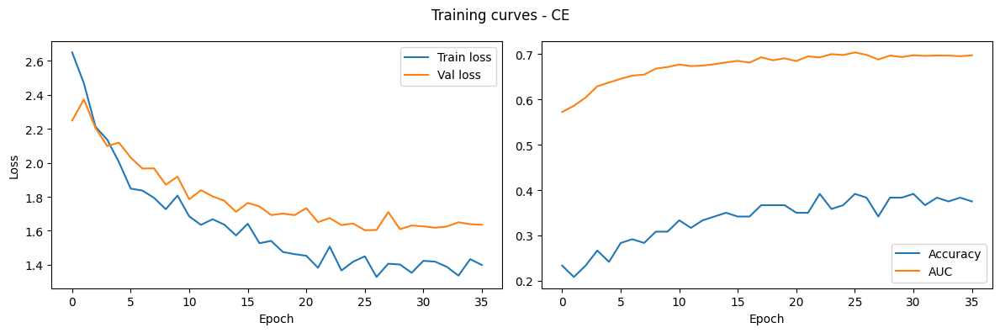


val set results:
	Macro F1: 0.3259
	QWK: 0.5317
	Accuracy: 0.3917
	AUC: 0.7037

Per-class metrics:
	Grade 0: precision=0.862	recall=0.463	F1=0.602
	Grade 1: precision=0.212	recall=0.583	F1=0.311
	Grade 2: precision=0.261	recall=0.214	F1=0.235
	Grade 3: precision=0.320	recall=0.400	F1=0.356
	Grade 4: precision=0.100	recall=0.167	F1=0.125


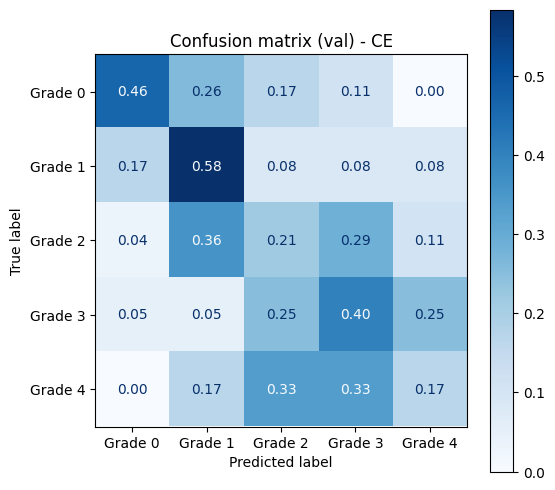

In [23]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'frozen_backbone' 
use_coral = False         
num_classes = len(classes)

    
classes = np.unique(all_targets)
class_weights = compute_class_weight('balanced', classes=classes, y=all_targets)
w = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)
print(f"\tClass weights:\t", dict(zip(classes.tolist(), np.round(w.cpu().numpy(), 3))))

train_fold = FolderDataset(all_paths, all_targets, train_transforms)
train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

val_loader   = DataLoader(val_data,   BATCH_SIZE, shuffle=False,
                            worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

model_ce = get_model(num_classes=num_classes, strategy=strategy, use_coral=use_coral)
set_trainable_layers(model_ce, strategy)

model_ce, metrics_ce, history_ce = train_ce(model_ce, train_loader, val_loader,
        epochs=EPOCHS, class_weights_data=w, plot=True)

## 8. Frozen backbone: CORAL model CV and final training


Fold 1/5
	CORAL importance weights: [0.7661134 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.0780 | Val loss: 1.9236 | Acc: 0.3796 | QWK: 0.3165 | AUC: 0.6234
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.6082 | Val loss: 1.6530 | Acc: 0.4630 | QWK: 0.5031 | AUC: 0.7072
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.5017 | Val loss: 1.5510 | Acc: 0.4583 | QWK: 0.5773 | AUC: 0.7301
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.4441 | Val loss: 1.5004 | Acc: 0.4676 | QWK: 0.5998 | AUC: 0.7384
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.4085 | Val loss: 1.4781 | Acc: 0.4630 | QWK: 0.6090 | AUC: 0.7391
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.3856 | Val loss: 1.4556 | Acc: 0.4630 | QWK: 0.5934 | AUC: 0.7412
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3564 | Val loss: 1.4202 | Acc: 0.4861 | QWK: 0.6193 | AUC: 0.7512
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3663 | Val loss: 1.4308 | Acc: 0.4769 | QWK: 0.6190 | AUC: 0.7498
	Epoch 40/50 | LR: 9.64e-05 | Train loss:

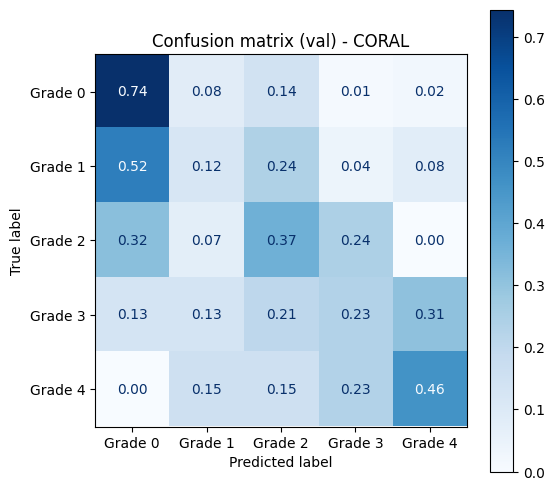


Fold 2/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.0344 | Val loss: 2.0190 | Acc: 0.3472 | QWK: 0.1881 | AUC: 0.5488
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.6183 | Val loss: 1.7576 | Acc: 0.4213 | QWK: 0.4226 | AUC: 0.6366
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.4864 | Val loss: 1.6509 | Acc: 0.4306 | QWK: 0.5317 | AUC: 0.6683
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.4501 | Val loss: 1.5898 | Acc: 0.4352 | QWK: 0.5594 | AUC: 0.6888
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.3981 | Val loss: 1.5579 | Acc: 0.4398 | QWK: 0.5654 | AUC: 0.6891
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.3449 | Val loss: 1.5265 | Acc: 0.4444 | QWK: 0.5741 | AUC: 0.6965
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3332 | Val loss: 1.5045 | Acc: 0.4630 | QWK: 0.5684 | AUC: 0.7040
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3563 | Val loss: 1.4882 | Acc: 0.4444 | QWK: 0.5724 | AUC: 0.7117
	Epoch 40/50 | LR: 9.64e-05 | Train loss:

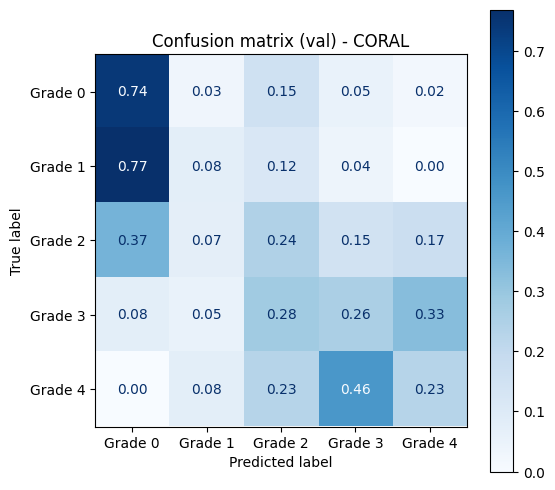


Fold 3/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.1338 | Val loss: 2.0652 | Acc: 0.2917 | QWK: 0.2008 | AUC: 0.5567
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.6501 | Val loss: 1.7658 | Acc: 0.4213 | QWK: 0.4535 | AUC: 0.6521
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.5279 | Val loss: 1.6982 | Acc: 0.4074 | QWK: 0.5184 | AUC: 0.6756
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.4422 | Val loss: 1.6331 | Acc: 0.4259 | QWK: 0.5402 | AUC: 0.6873
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.4102 | Val loss: 1.5786 | Acc: 0.4491 | QWK: 0.5580 | AUC: 0.7021
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.3919 | Val loss: 1.5499 | Acc: 0.4676 | QWK: 0.5706 | AUC: 0.7073
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3432 | Val loss: 1.5440 | Acc: 0.4491 | QWK: 0.5637 | AUC: 0.7093
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3459 | Val loss: 1.5515 | Acc: 0.4444 | QWK: 0.5695 | AUC: 0.7078
	Epoch 40/50 | LR: 9.64e-05 | Train loss:

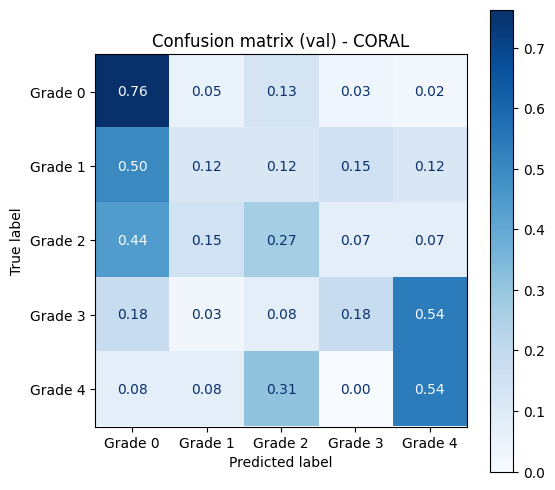


Fold 4/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.1237 | Val loss: 1.9238 | Acc: 0.3889 | QWK: 0.1652 | AUC: 0.5907
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.6644 | Val loss: 1.6881 | Acc: 0.4815 | QWK: 0.4826 | AUC: 0.6741
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.5611 | Val loss: 1.5908 | Acc: 0.4722 | QWK: 0.5326 | AUC: 0.6919
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.4693 | Val loss: 1.5184 | Acc: 0.4861 | QWK: 0.5877 | AUC: 0.7075
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.4131 | Val loss: 1.4747 | Acc: 0.4583 | QWK: 0.5995 | AUC: 0.7173
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.3844 | Val loss: 1.4506 | Acc: 0.4722 | QWK: 0.6265 | AUC: 0.7248
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3854 | Val loss: 1.4467 | Acc: 0.4630 | QWK: 0.6231 | AUC: 0.7222
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3617 | Val loss: 1.4513 | Acc: 0.4537 | QWK: 0.6146 | AUC: 0.7202
	Epoch 40/50 | LR: 9.64e-05 | Train loss:

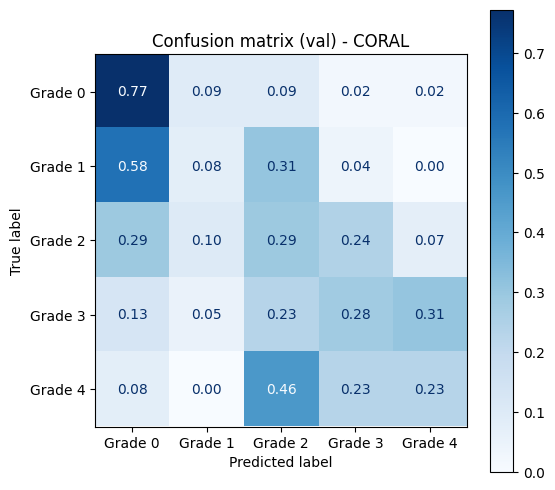


Fold 5/5
	CORAL importance weights: [0.76483685 0.77840304 0.8988224  1.        ]
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.0364 | Val loss: 1.9776 | Acc: 0.3657 | QWK: 0.1898 | AUC: 0.5851
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.6149 | Val loss: 1.7667 | Acc: 0.4352 | QWK: 0.4294 | AUC: 0.6667
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.4808 | Val loss: 1.6719 | Acc: 0.4306 | QWK: 0.5275 | AUC: 0.6916
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.4474 | Val loss: 1.6100 | Acc: 0.4444 | QWK: 0.5686 | AUC: 0.7046
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.3503 | Val loss: 1.5860 | Acc: 0.4491 | QWK: 0.5988 | AUC: 0.7185
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.3322 | Val loss: 1.5402 | Acc: 0.4583 | QWK: 0.6127 | AUC: 0.7224
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3460 | Val loss: 1.5297 | Acc: 0.4491 | QWK: 0.6159 | AUC: 0.7216
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3386 | Val loss: 1.5322 | Acc: 0.4491 | QWK: 0.6227 | AUC: 0.7303
	Epoch 40/50 | LR: 9.64e-05 | Train l

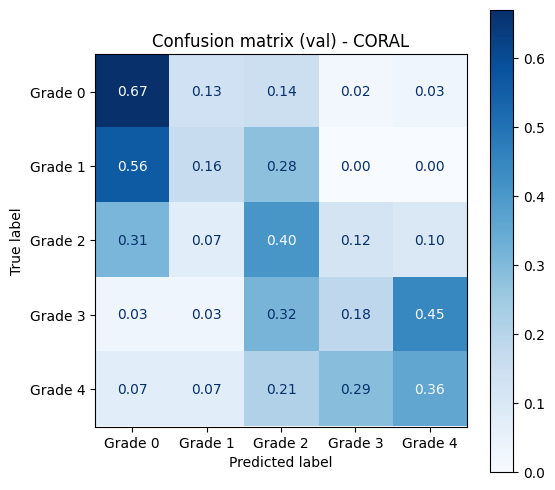


Results (Coral, 5-fold CV):
	Accuracy: 0.4685 +/- 0.0153
	QWK: 0.6024 +/- 0.0231
	AUC: 0.7291 +/- 0.0139


In [25]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'frozen_backbone' 
use_coral = True        
num_classes = len(classes)

N_FOLDS, EPOCHS, BATCH_SIZE = 5, 50, 32

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
fold_results_coral = []


for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(all_targets)), all_targets), 1):
    print(f"\nFold {fold}/{N_FOLDS}")
    
    coral_importance = compute_coral_importance(all_targets[train_idx])
    print(f"\tCORAL importance weights: {coral_importance.cpu().numpy()}")
    
    fold_pixels = train_proc_imgs[train_idx].reshape(-1, 3).astype(np.float32)
    fold_mean = torch.tensor(fold_pixels.mean(axis=0) / 255.0)
    fold_std = torch.tensor(fold_pixels.std(axis=0) / 255.0)
    fold_train_transforms = make_train_transforms(fold_mean, fold_std)
    fold_eval_transforms = make_eval_transforms(fold_mean, fold_std)

    train_fold = FolderDataset([all_paths[i] for i in train_idx], all_targets[train_idx], fold_train_transforms)
    train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    val_fold   = FolderDataset([all_paths[i] for i in val_idx],   all_targets[val_idx],   fold_eval_transforms)
    val_loader   = DataLoader(val_fold,   BATCH_SIZE, shuffle=False,
                              worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    model = get_model(num_classes=num_classes, strategy=strategy, use_coral=use_coral)
    set_trainable_layers(model, strategy)
    fold_model, fold_metrics, _ = train_coral(model, train_loader, val_loader,
            epochs=EPOCHS, importance_weights=coral_importance)
    acc = accuracy_score(fold_metrics['val_labels'], fold_metrics['val_preds'])
    qwk = cohen_kappa_score(fold_metrics['val_labels'], fold_metrics['val_preds'], weights='quadratic')
    auc = roc_auc_score(fold_metrics['val_labels'], fold_metrics['val_probs'], multi_class='ovr', average='macro')
    fold_results_coral.append({'acc': acc, 'qwk': qwk, 'auc': auc})

accs_coral = [r['acc'] for r in fold_results_coral]
qwks_coral = [r['qwk'] for r in fold_results_coral]
aucs_coral = [r['auc'] for r in fold_results_coral]

print(f"\nResults (Coral, {N_FOLDS}-fold CV):")
print(f"\tAccuracy: {np.mean(accs_coral):.4f} +/- {np.std(accs_coral):.4f}")
print(f"\tQWK: {np.mean(qwks_coral):.4f} +/- {np.std(qwks_coral):.4f}")
print(f"\tAUC: {np.mean(aucs_coral):.4f} +/- {np.std(aucs_coral):.4f}")

### Training on the full training set

	Epoch  1/50 | LR: 9.99e-04 | Train loss: 2.0352 | Val loss: 1.8805 | Acc: 0.4417 | QWK: 0.3703 | AUC: 0.5979
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.6029 | Val loss: 1.6200 | Acc: 0.5167 | QWK: 0.5783 | AUC: 0.7111
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.4359 | Val loss: 1.5321 | Acc: 0.5083 | QWK: 0.6265 | AUC: 0.7455
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.4228 | Val loss: 1.4577 | Acc: 0.4750 | QWK: 0.6400 | AUC: 0.7523
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.3514 | Val loss: 1.4007 | Acc: 0.5333 | QWK: 0.6806 | AUC: 0.7793
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.3456 | Val loss: 1.3704 | Acc: 0.5333 | QWK: 0.6645 | AUC: 0.7811
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.3004 | Val loss: 1.3534 | Acc: 0.5333 | QWK: 0.6671 | AUC: 0.7761
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.3163 | Val loss: 1.3404 | Acc: 0.5750 | QWK: 0.6760 | AUC: 0.7814
	Early stopping at epoch 36


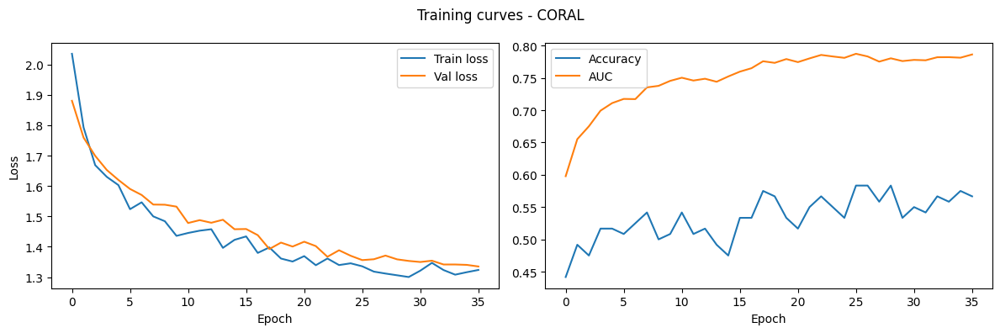


val set results:
	Macro F1: 0.4567
	QWK: 0.6954
	Accuracy: 0.5833
	AUC: 0.7874

Per-class metrics:
	Grade 0: precision=0.796	recall=0.796	F1=0.796
	Grade 1: precision=0.235	recall=0.333	F1=0.276
	Grade 2: precision=0.571	recall=0.429	F1=0.490
	Grade 3: precision=0.529	recall=0.450	F1=0.486
	Grade 4: precision=0.182	recall=0.333	F1=0.235


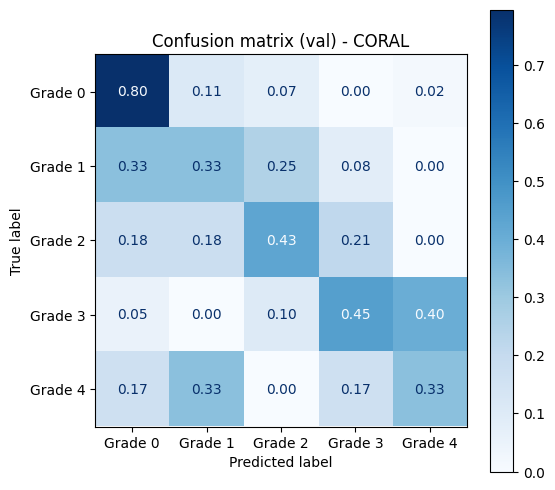

In [26]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'frozen_backbone' 
use_coral = True         
num_classes = len(classes)

imp = compute_coral_importance(all_targets)

train_fold = FolderDataset(all_paths, all_targets, train_transforms)
train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

val_loader   = DataLoader(val_data,   BATCH_SIZE, shuffle=False,
                            worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

model_coral = get_model(num_classes=num_classes, strategy=strategy, use_coral=use_coral)
set_trainable_layers(model_coral, strategy)

model_coral, metrics_coral, history_coral = train_coral(model_coral, train_loader, val_loader,
        epochs=EPOCHS, importance_weights=imp, plot=True)

## 9. Operating point selection


### Evaluation on the test set


In [27]:
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False,
                         worker_init_fn=worker_init_fn, num_workers=2, generator=gen)


test set results:
	Macro F1: 0.3717
	QWK: 0.5306
	Accuracy: 0.4375
	AUC: 0.7328

Per-class metrics:
	Grade 0: precision=0.745	recall=0.471	F1=0.577
	Grade 1: precision=0.206	recall=0.457	F1=0.284
	Grade 2: precision=0.385	recall=0.326	F1=0.353
	Grade 3: precision=0.429	recall=0.574	F1=0.491
	Grade 4: precision=0.158	recall=0.150	F1=0.154


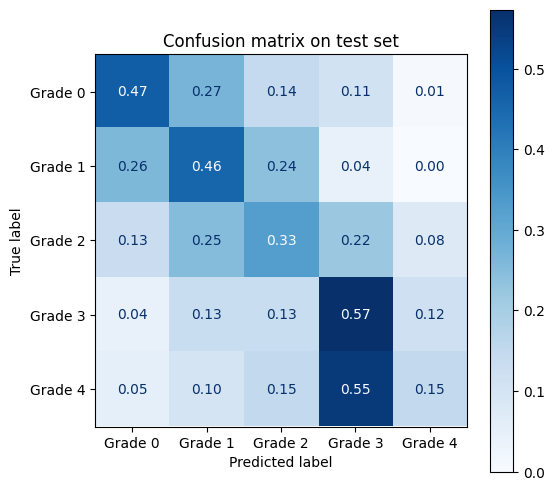

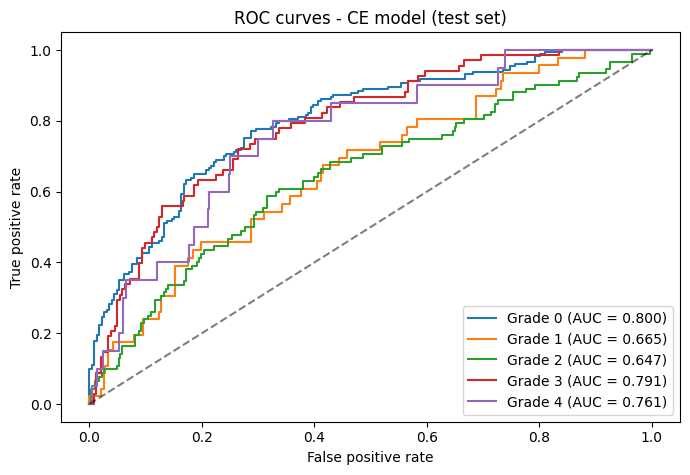

In [28]:
test_preds_ce, test_labels_ce, test_probs_ce, _ = validate_ce(model_ce, test_loader)
report_metrics(test_labels_ce, test_preds_ce, test_probs_ce, "test", "Confusion matrix on test set")
plot_roc(test_labels_ce, test_probs_ce, "ROC curves - CE model (test set)")


test set results:
	Macro F1: 0.3012
	QWK: 0.6077
	Accuracy: 0.4500
	AUC: 0.7238

Per-class metrics:
	Grade 0: precision=0.682	recall=0.753	F1=0.716
	Grade 1: precision=0.130	recall=0.130	F1=0.130
	Grade 2: precision=0.357	recall=0.272	F1=0.309
	Grade 3: precision=0.300	recall=0.221	F1=0.254
	Grade 4: precision=0.071	recall=0.150	F1=0.097


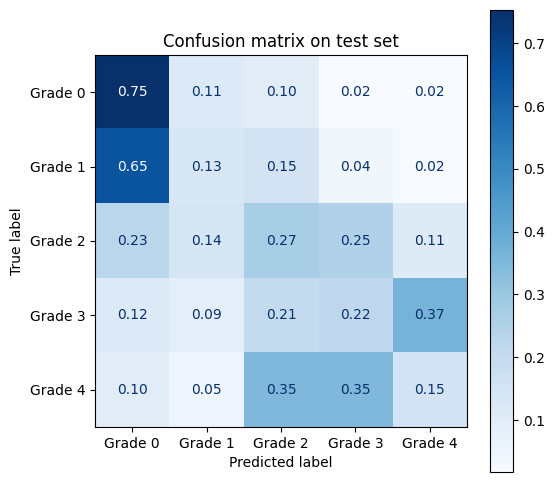

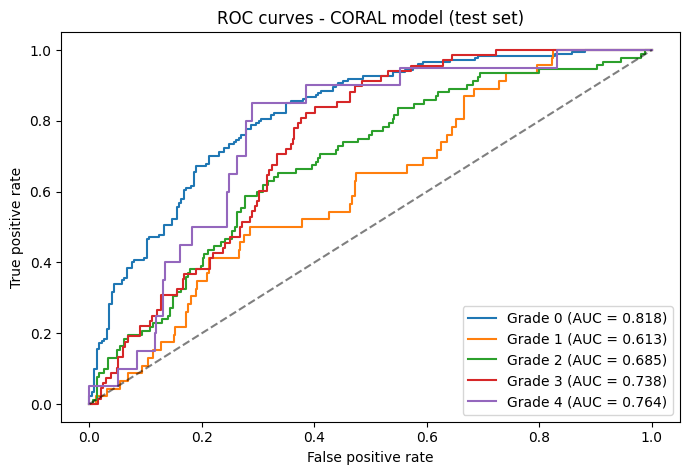

In [29]:
coral_importance = compute_coral_importance(all_targets)
test_preds_coral, test_labels_coral, test_probs_coral, _ = validate_coral(model_coral, test_loader, coral_importance)
report_metrics(test_labels_coral, test_preds_coral, test_probs_coral, "test", "Confusion matrix on test set")
plot_roc(test_labels_coral, test_probs_coral, "ROC curves - CORAL model (test set)")

### Threshold selection

In [30]:
def pick_best_threshold(probs_val: np.ndarray, val_bin: np.ndarray) -> tuple[np.ndarray, dict[str, int], np.ndarray, np.ndarray]:
    """
    Tune threshold on validation set.

    Args:
        probs_val: predicted probabilities for the positive class (referable).
        val_bin: binary labels (0 for non-referable, 1 for referable).
    Returns:
        cand: array of candidate thresholds and their Se/Sp.
        pts: dict of selected threshold indices for Youden, default (0.5), Se >= 0.95, Sp >= 0.95.
        fpr: false positive rates for ROC curve.
        tpr: true positive rates for ROC curve.
    """
    fpr, tpr, _ = roc_curve(val_bin, probs_val)

    unique_thrs = np.unique(probs_val)
    cand = []
    for thr in unique_thrs:
        preds = (probs_val >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(val_bin, preds).ravel()
        se = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        sp = tn / (tn + fp) if (tn + fp) > 0 else 0.0
        cand.append((thr, se, sp))
    cand = np.array(cand)

    tp = val_bin.sum()
    se = tp / len(val_bin) if len(val_bin) > 0 else 0.0
    sp = 1.0
    cand = np.vstack([cand, [0.0, se, sp]])

    if len(cand) == 0:
        return cand, {}, fpr, tpr

    youden_idx = np.argmax(cand[:, 1] + cand[:, 2] - 1)

    mask_se = cand[:, 1] >= 0.95
    screen_idx = np.where(mask_se)[0][np.argmax(cand[mask_se, 2])] if mask_se.any() else None

    mask_sp = cand[:, 2] >= 0.95
    diag_idx = np.where(mask_sp)[0][np.argmax(cand[mask_sp, 1])] if mask_sp.any() else None

    default_idx = np.argmin(np.abs(cand[:, 0] - 0.5))

    pts = {
        'Youden': youden_idx,
        'Default (0.5)': default_idx,
        'Se >= 0.95': screen_idx,
        'Sp >= 0.95': diag_idx,
    }
    return cand, pts, fpr, tpr


def report_roc_plot(model_name: str, cand: np.ndarray, pts: dict[str, int], fpr: np.ndarray, tpr: np.ndarray, auc_val: float):
    """
    Plot ROC curve with candidate thresholds.

    Args:
        model_name: string for plot title.
        cand: array of candidate thresholds and their Se/Sp.
        pts: dict of selected threshold indices for Youden, default (0.5), Se >= 0.95, Sp >= 0.95.
        fpr: false positive rates for ROC curve.
        tpr: true positive rates for ROC curve.
        auc_val: AUC value for the ROC curve.
    """
    plt.figure(figsize=(7, 5.5))
    plt.plot(fpr, tpr, 'b-', linewidth=2,
             label=f'ROC curve (AUC = {auc_val:.3f})')
    colors = {'Youden': 'green', 'Default (0.5)': 'red', 'Se >= 0.95': 'orange', 'Sp >= 0.95': 'purple'}
    markers = {'Youden': 'D', 'Default (0.5)': 'o', 'Se >= 0.95': 's', 'Sp >= 0.95': '^'}

    for name, idx in pts.items():
        if idx is None:
            continue
        thr, se, sp = cand[idx]
        plt.scatter(1 - sp, se, color=colors[name], marker=markers[name], s=80, zorder=5,
                    label=f"{name} (thr={thr:.3f}, Se={se:.3f}, Sp={sp:.3f})")
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.4)
    plt.xlabel('1 - Specificity (FPR)')
    plt.ylabel('Sensitivity (TPR)')
    plt.title(f'ROC curve - {model_name} (validation, referable vs non-referable)')
    plt.legend(fontsize=8, loc='lower right')
    plt.tight_layout()
    plt.show()


def print_table(cand: np.ndarray, pts: dict[str, int], labels: np.ndarray, probs: np.ndarray, split_name: str):
    """
    Print Se, Sp, PPV, NPV table for the given split.

    Args:
        cand: array of candidate thresholds and their Se/Sp.
        pts: dict of selected threshold indices for Youden, default (0.5), Se >= 0.95, Sp >= 0.95.
        labels: true binary labels (0 or 1).
        probs: predicted probabilities for the positive class (referable).
        split_name: string label for the split (e.g., "Validation" or "Test").
    """
    print(f"\n{split_name} metrics - candidate thresholds")
    print(f"{'Point':<20s}  {'Thr':>5s}  {'Se':>5s}  {'Sp':>5s}  {'PPV':>5s}  {'NPV':>5s}")
    for name, idx in pts.items():
        if idx is None:
            print(f"{name:<20s}  {'-':>5s}  {'-':>5s}  {'-':>5s}  {'-':>5s}  {'-':>5s}")
            continue
        thr, se, sp = cand[idx]
        preds = (probs >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(labels, preds).ravel()
        ppv = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        npv = tn / (tn + fn) if (tn + fn) > 0 else 0.0
        print(f"{name:<20s}  {thr:.3f}  {se:.3f}  {sp:.3f}  {ppv:.3f}  {npv:.3f}")

### Clinical decision thresholds

In medical screening, relying on the default classification threshold (argmax for Cross-Entropy, or 0.5 for CORAL sigmoids) is often suboptimal. The choice of threshold should be guided by the clinical task, evaluating the cost of different types of errors.

### Task formulation

We reframe the 5-class ordinal grading task as a **binary screening decision**:

- **Non-referable** (grades 0-1): no immediate treatment needed.
- **Referable** (grades 2-4): requires specialist referral or treatment.

This mirrors real-world diabetic retinopathy screening workflows (e.g., NHS Diabetic Eye Screening Programme), where the goal is to **maximize sensitivity** (do not miss a diseased patient) while maintaining *acceptable specificity*.

#### Why considering Grade 1 (Mild NPDR) non-referable

**TODO: reference for NHS Diabetic Eye Screening Programme and ICDR guidelines**

There are no public documents about Italian healthcare, so we refer to the NHS Diabetic Eye Screening Programme and ICDR guidelines, which are widely accepted internationally.

[NHS Diabetic Eye Screening Programme](https://www.gov.uk/government/publications/diabetic-eye-screening-retinal-image-grading-criteria/nhs-diabetic-eye-screening-programme-grading-definitions-for-referable-disease-start-date-october-01)

[ICDR Guidelines](https://pmc.ncbi.nlm.nih.gov/articles/PMC10436766/)


Considering the standard diabetic retinopathy severity scale (ICDR):

| Grade | Description | Screening Decision |
|-------|-------------|-------------------|
| 0 | No DR | Annual/Bi-annual screening |
| 1 | Mild NPDR | Annual screening |
| 2 | Moderate NPDR | Screening interval shorter than one year |
| 3 | Severe NPDR | Specialist referral |
| 4 | Proliferative DR | Specialist referral and possible treatment |

Clinically, **Grade 1 (Mild NPDR)** is considered **non-referable** because it does not require treatment, but only annual monitoring, similar to Grade 0. The standard international referral threshold (NHS Diabetic Eye Screening Programme, ICDR guidelines) is **Grade 2+**.

If Grade 1 were included as referable:
- **Sensitivity would increase** (nearly all diseased patients would be caught).
- **Specificity would collapse**: many Mild NPDR patients would be referred unnecessarily.
- **PPV would drop significantly**, overwhelming the healthcare system with false positives.

Choosing Grade 2+ as the binarization threshold is therefore a **well-established clinical compromise**, balancing the need to detect disease against the cost of over-referral, overwhelming the healthcare system, and causing psychological stress to patients.

### Methodology

1. **Validation-based threshold tuning**  
   All candidate thresholds are evaluated exclusively on the validation set (120 samples), avoiding any data leakage and keeping the test set untouched for final evaluation. It is worth observing that 120 samples is relatively small for threshold calibration, so the selected thresholds may not generalize perfectly, but the final test evaluation provides an unbiased estimate of their true performance.

2. **Candidate operating points**  
   - **Youden Index** (Youden, 1950): maximizes $Se + Sp - 1$, corresponding to the point farthest from the diagonal on the ROC curve. Often used as a default when no clinical preference is specified. **TODO: add reference**
   - **Screening threshold** ($Se \ge 0.95$): finds the threshold with the highest specificity while maintaining at least $95\%$ sensitivity. *Prioritizes patient safety* by minimizing false negatives.
   - **Diagnosis threshold** ($Sp \ge 0.95$): finds the threshold with the highest sensitivity while maintaining at least $95\%$ specificity. *Prioritizes resource efficiency* by minimizing unnecessary referrals.
   - **Default 0.5**: included as a reference baseline.

3. **ROC curve analysis**
   Thanks to the ROC curve, we can visualize the *trade-off between sensitivity and specificity* for different thresholds and select the most appropriate operating point based on clinical priorities.

4. **Performance metrics**  
   For each candidate threshold we report:
   - **Sensitivity (Se) (or Recall)**: true positive rate $\frac{TP}{(TP + FN)}$, it measures the ability to correctly identify the referable class (patients with the condition).
   - **Specificity (Sp)**: true negative rate $\frac{TN}{(TN + FP)}$, it measures the ability to correctly identify the non-referable class (healthy patients).
   - **Positive Predictive Value (PPV)**: precision for the referable class $\frac{TP}{(TP + FP)}$
   - **Negative Predictive Value (NPV)**: value that measures the proportion of true negatives among all negative predictions $\frac{TN}{(TN + FN)}$

5. **Final evaluation on the test set**  
   The screening threshold selected on the validation set is applied to the held-out test set (400 samples) with all the aforementioned metrics reported. This has been done by using both the best CE model and the best CORAL model, to compare their performance in a clinically relevant scenario.

### Clinical rationale

In a screening scenario, the cost of a false negative (missing a patient with referable DR) far outweighs the cost of a false positive (unnecessary referral). Therefore, we adopt the $Se \ge 0.95$ threshold as our recommended operating point, guaranteeing that at least $95\%$ of referable cases are detected, while maximizing specificity to avoid overwhelming the referral system.


CE model - tuning on validation


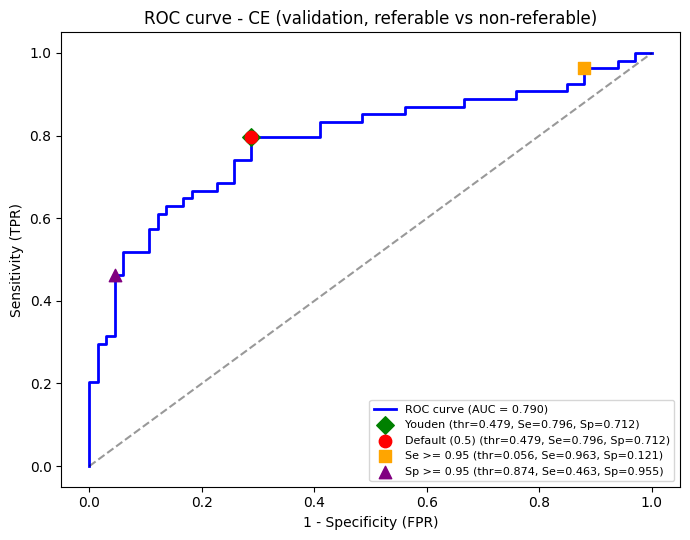


Validation metrics - candidate thresholds
Point                   Thr     Se     Sp    PPV    NPV
Youden                0.479  0.796  0.712  0.694  0.810
Default (0.5)         0.479  0.796  0.712  0.694  0.810
Se >= 0.95            0.056  0.963  0.121  0.473  0.800
Sp >= 0.95            0.874  0.463  0.955  0.893  0.685

	CE test set @ thr=0.056 (screening):
	Se=0.967  Sp=0.177  PPV=0.490  NPV=0.867


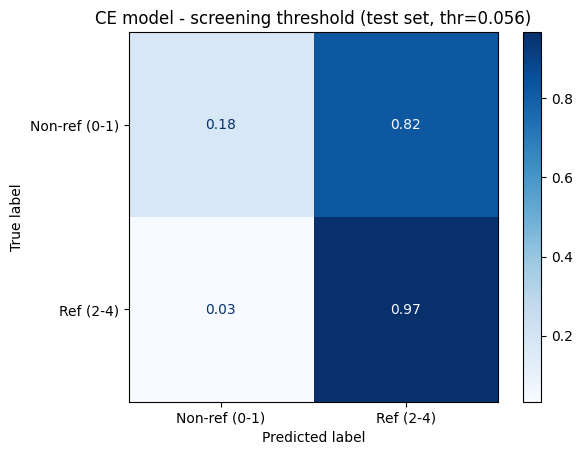

CORAL model - tuning on validation


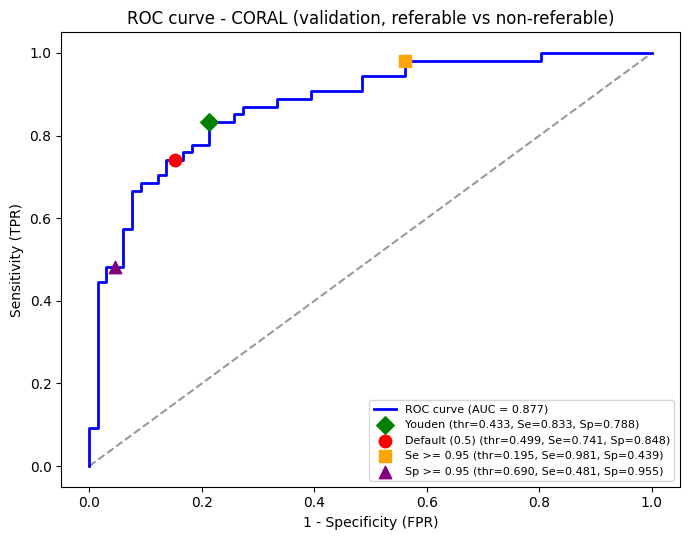


Validation metrics - candidate thresholds
Point                   Thr     Se     Sp    PPV    NPV
Youden                0.433  0.833  0.788  0.763  0.852
Default (0.5)         0.499  0.741  0.848  0.800  0.800
Se >= 0.95            0.195  0.981  0.439  0.589  0.967
Sp >= 0.95            0.690  0.481  0.955  0.897  0.692

	CORAL test set @ thr=0.195 (screening):
	Se=0.961  Sp=0.377  PPV=0.558  NPV=0.922


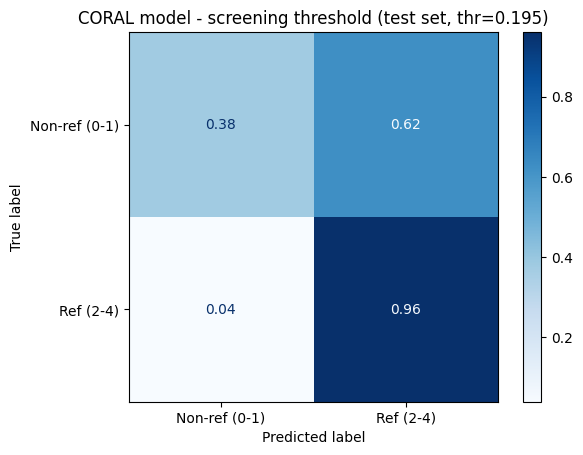

In [31]:
val_preds_ce, val_labels_ce, val_probs_ce, _ = validate_ce(model_ce, val_loader)
val_preds_coral, val_labels_coral, val_probs_coral, _ = validate_coral(
    model_coral, val_loader, compute_coral_importance(all_targets))

val_bin = (val_labels_ce >= 2).astype(int)

print("CE model - tuning on validation")
probs_ref_val_ce = val_probs_ce[:, 2:].sum(axis=1)
cand_ce, pts_ce, fpr_ce, tpr_ce = pick_best_threshold(probs_ref_val_ce, val_bin)
report_roc_plot('CE', cand_ce, pts_ce, fpr_ce, tpr_ce,
                roc_auc_score(val_bin, probs_ref_val_ce))
print_table(cand_ce, pts_ce, val_bin, probs_ref_val_ce, "Validation")

if pts_ce.get('Se >= 0.95') is not None:
    thr_screen_ce = cand_ce[pts_ce['Se >= 0.95'], 0]
    test_bin = (test_labels_ce >= 2).astype(int)
    probs_ref_test_ce = test_probs_ce[:, 2:].sum(axis=1)
    preds_screen_ce = (probs_ref_test_ce >= thr_screen_ce).astype(int)
    tn, fp, fn, tp = confusion_matrix(test_bin, preds_screen_ce).ravel()
    print(f"\n\tCE test set @ thr={thr_screen_ce:.3f} (screening):")
    print(f"\tSe={tp/(tp+fn):.3f}  Sp={tn/(tn+fp):.3f}  PPV={tp/(tp+fp):.3f}  NPV={tn/(tn+fn):.3f}")
    cm_screen = confusion_matrix(test_bin, preds_screen_ce, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_screen,
        display_labels=['Non-ref (0-1)', 'Ref (2-4)'])
    disp.plot(cmap=plt.cm.Blues, values_format='.2f')
    plt.title(f'CE model - screening threshold (test set, thr={thr_screen_ce:.3f})')
    plt.show()

print("CORAL model - tuning on validation")
probs_ref_val_coral = val_probs_coral[:, 2:].sum(axis=1)
cand_co, pts_co, fpr_co, tpr_co = pick_best_threshold(probs_ref_val_coral, val_bin)
report_roc_plot('CORAL', cand_co, pts_co, fpr_co, tpr_co,
                roc_auc_score(val_bin, probs_ref_val_coral))
print_table(cand_co, pts_co, val_bin, probs_ref_val_coral, "Validation")

if pts_co.get('Se >= 0.95') is not None:
    thr_screen_co = cand_co[pts_co['Se >= 0.95'], 0]
    probs_ref_test_coral = test_probs_coral[:, 2:].sum(axis=1)
    preds_screen_co = (probs_ref_test_coral >= thr_screen_co).astype(int)
    tn, fp, fn, tp = confusion_matrix(test_bin, preds_screen_co).ravel()
    print(f"\n\tCORAL test set @ thr={thr_screen_co:.3f} (screening):")
    print(f"\tSe={tp/(tp+fn):.3f}  Sp={tn/(tn+fp):.3f}  PPV={tp/(tp+fp):.3f}  NPV={tn/(tn+fn):.3f}")
    cm_screen = confusion_matrix(test_bin, preds_screen_co, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_screen,
        display_labels=['Non-ref (0-1)', 'Ref (2-4)'])
    disp.plot(cmap=plt.cm.Blues, values_format='.2f')
    plt.title(f'CORAL model - screening threshold (test set, thr={thr_screen_co:.3f})')
    plt.show()

## 10. Explaining model predictions (HiResCAM)


In [55]:
from torch import tensor


def classify(model: torch.nn.Module, model_type: str = 'ce') -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray, torch.Tensor, np.ndarray]:
    """
    Classify all test images with given model. 
    
    Args:
        model (torch.nn.Module): The model to use for classification.
        model_type (str): The type of model ('ce' for Cross-Entropy, 'coral' for CORAL).
    Returns:
        Tuple of predicted labels, true labels, original images, background images, processed tensors, and predicted probabilities.
    """
    model.eval()
    preds, labels = [], []
    orig_imgs, bg_imgs, proc_tensors, probas_list = [], [], [], []
    for i in range(len(test_dataset)):
        orig = test_dataset.imgs[i]
        proc = preprocess_ben_graham(orig.copy(), img_size=224)
        proc_pil = Image.fromarray(proc).convert('RGB')
        tensor = eval_transforms(proc_pil).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            logits = model(tensor)
            if model_type == 'ce':
                probas = torch.softmax(logits, dim=1)
                p = probas.argmax(dim=1).item()
            else:
                probas = torch.sigmoid(logits)
                p = proba_to_label(probas).item()
                class_probs = torch.cat([
                    1 - probas[:, :1],
                    probas[:, :-1] - probas[:, 1:],
                    probas[:, -1:],
                ], dim=1)
                probas = class_probs

        preds.append(p)
        labels.append(int(test_dataset.labels[i]))
        orig_imgs.append(orig)
        bg_imgs.append(proc)
        proc_tensors.append(tensor.squeeze(0))
        probas_list.append(probas.squeeze(0).cpu().numpy())
    return (np.array(preds), np.array(labels), np.array(orig_imgs),
            np.array(bg_imgs), torch.stack(proc_tensors), np.array(probas_list))


def select_correct_wrong(preds: np.ndarray, labels: np.ndarray) -> tuple[dict[int, int], dict[int, int]]:
    """
    Select one correct and one wrong sample index for each grade (0-4) from predictions and labels.

    Args:
        preds: numpy array of predicted labels.
        labels: numpy array of true labels.
    Returns:
        correct_idx: dictionary mapping grade to index of a correct prediction (or None if none).
        wrong_idx: dictionary mapping grade to index of a wrong prediction (or None if none).
    """
    correct_idx, wrong_idx = {}, {}
    for grade in range(5):
        grade_mask = labels == grade
        correct = grade_mask & (preds == grade)
        wrong   = grade_mask & (preds != grade)
        correct_idx[grade] = np.where(correct)[0][0] if correct.any() else None
        wrong_idx[grade]   = np.where(wrong)[0][0]   if wrong.any()   else None
    return correct_idx, wrong_idx


def get_target_layers(model: torch.nn.Module, block: int) -> list[nn.Module]:
    """
    Return target layer list for HiResCAM given block number (1-5) for EfficientNetV2.
    
    Args:
        model: The model for which to get target layers.
        block: The block stage number (1 to len(model.blocks)).
    Returns:
        A list of target layers.
    """
    # EfficientNet in timm raggruppa i blocchi in model.blocks
    # Possiamo puntare all'ultimo layer o blocco sequenziale dello stadio desiderato
    block_idx = min(block - 1, len(model.blocks) - 1)
    
    target = model.blocks[block_idx][-1]
    
    return [target]

def visualize_model(cam: torch.nn.Module, preds: np.ndarray, model_name: str, indices: dict[int, int], title: str = "Model visualization") -> None:
    """
    Plot original, Ben Graham, CAM overlay and confidence for selected indices.
    
    Args:
        cam: HiResCAM object.
        preds: numpy array of predicted labels.
        model_name: string for plot title.
        indices: dictionary mapping grade to index of sample to visualize.
        title: Title for the visualization (default: "Model visualization").
    """
    fig, axes = plt.subplots(5, 3, figsize=(13, 14))
    fig.suptitle(f'{title} - {model_name}', fontsize=14, y=0.98)

    for row, grade in enumerate(range(5)):
        idx = indices[grade]
        if idx is None:
            for col in range(3):
                axes[row, col].text(0.5, 0.5, '(no sample)', ha='center', va='center')
                axes[row, col].axis('off')
            continue

        orig = orig_imgs[idx]
        bg = bg_imgs[idx]
        orig_float = orig.astype(np.float32) / 255.0
        tensor = proc_tensors[idx].unsqueeze(0).clone().detach().to(DEVICE)
        tensor.requires_grad_(True)

        gt = int(ce_labels[idx])
        pd = int(preds[idx])

        if model_name == "CORAL":
            target = min(pd, 3)
        else:
            target = pd

        targets = [ClassifierOutputTarget(target)]
        grayscale_cam = cam(input_tensor=tensor, targets=targets)[0]
        overlay = show_cam_on_image(orig_float, grayscale_cam, use_rgb=True)

        axes[row, 0].imshow(orig)
        axes[row, 0].set_title(f'Original (true={gt})')
        axes[row, 0].axis('off')

        axes[row, 1].imshow(bg)
        axes[row, 1].set_title('Ben Graham')
        axes[row, 1].axis('off')

        axes[row, 2].imshow(overlay)
        axes[row, 2].set_title(f'HiResCAM block {BLOCK} (pred={pd})')
        axes[row, 2].axis('off')

    plt.tight_layout()
    plt.show()

/tmp/ipykernel_1274/1913534013.py:39: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  labels.append(int(test_dataset.labels[i]))


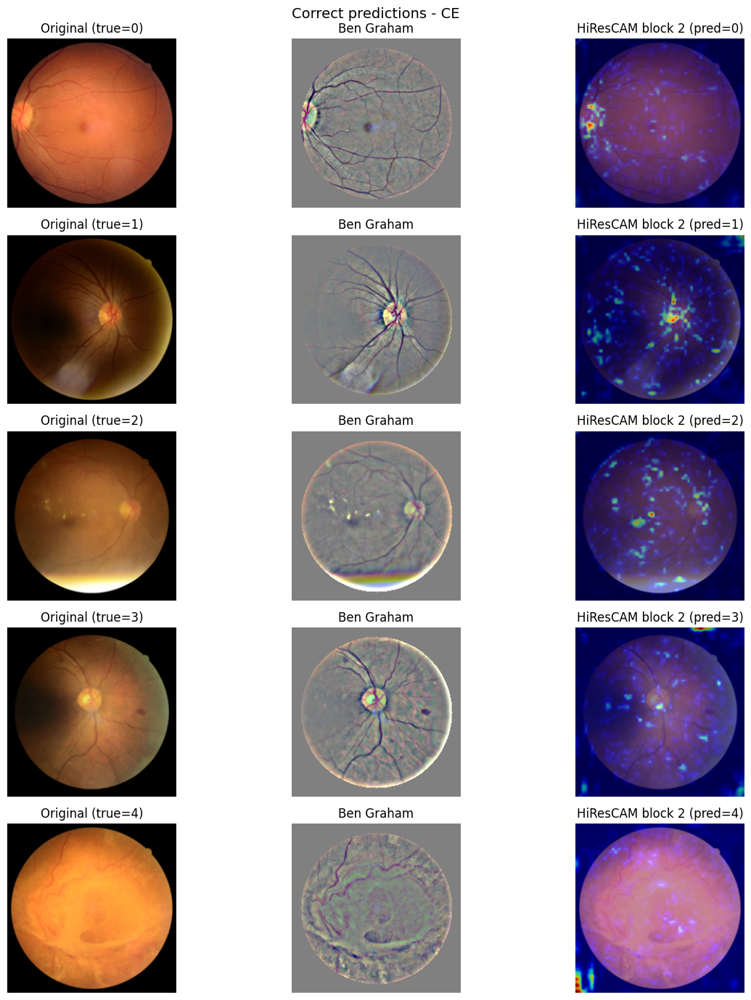

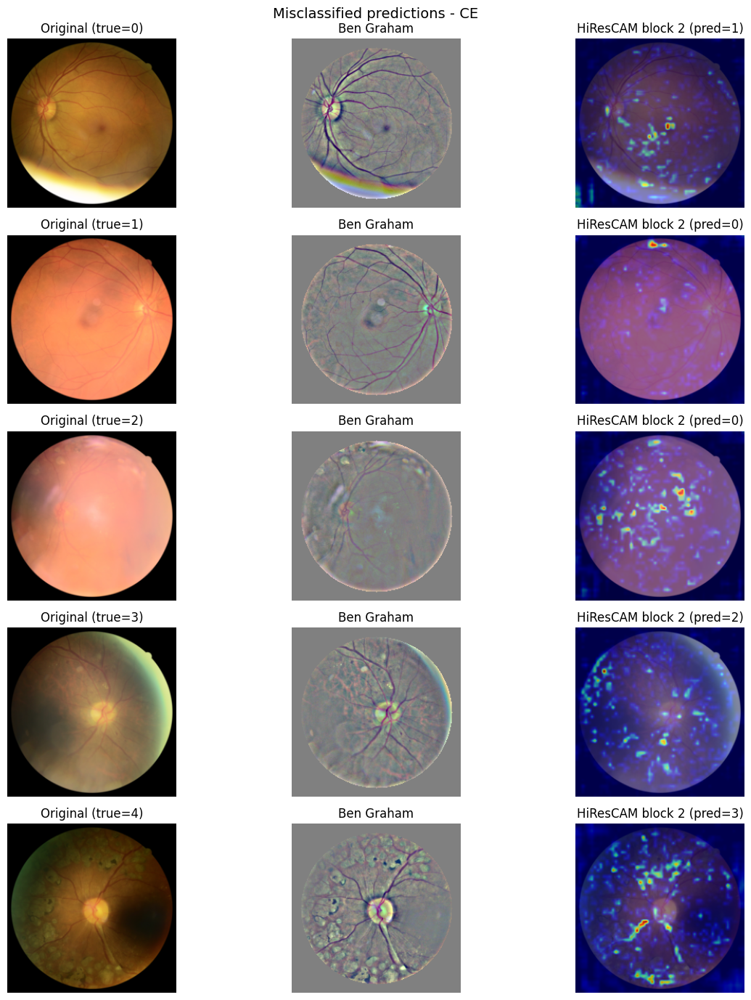

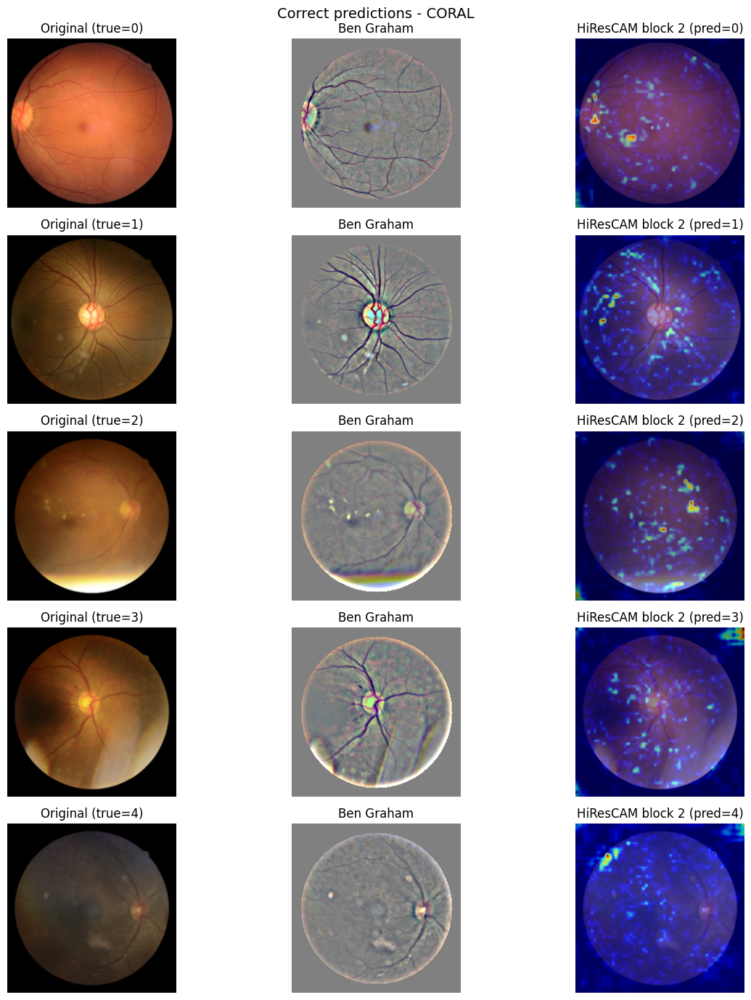

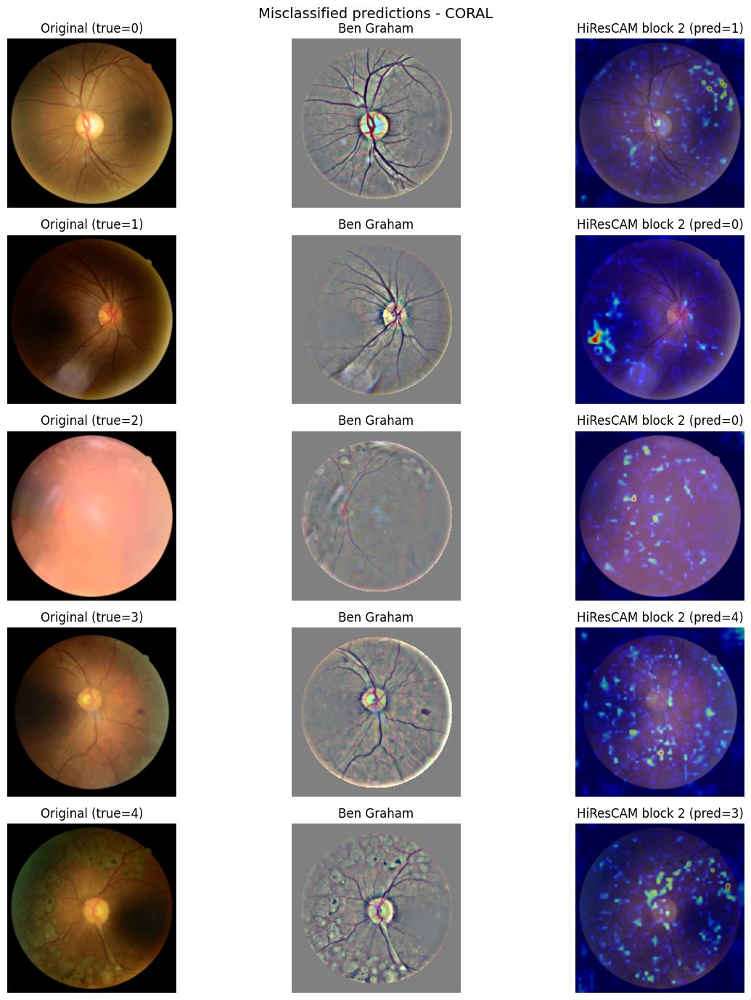

In [56]:
BLOCK = 2

ce_preds, ce_labels, orig_imgs, bg_imgs, proc_tensors, _ = classify(model_ce, 'ce')

coral_preds, coral_labels, _, _, _, _ = classify(model_coral, 'coral')

ce_correct, ce_wrong = select_correct_wrong(ce_preds, ce_labels)
coral_correct, coral_wrong = select_correct_wrong(coral_preds, coral_labels)

ce_target_layers = get_target_layers(model_ce, BLOCK)
coral_target_layers = get_target_layers(model_coral, BLOCK)

ce_cam = HiResCAM(model=model_ce, target_layers=ce_target_layers)
coral_cam = HiResCAM(model=model_coral, target_layers=coral_target_layers)

visualize_model(ce_cam, ce_preds, 'CE',
                ce_correct, 'Correct predictions')
visualize_model(ce_cam, ce_preds, 'CE',
                ce_wrong, 'Misclassified predictions')

visualize_model(coral_cam, coral_preds, 'CORAL',
                coral_correct, 'Correct predictions')
visualize_model(coral_cam, coral_preds, 'CORAL',
                coral_wrong, 'Misclassified predictions')
